In [21]:
# Importing Libraries: 

import meep as mp
import matplotlib.pyplot as plt
import numpy as np 
from IPython.display import Video 
from meep import mpb
from scipy.optimize import minimize

%matplotlib inline 

In [22]:
def tapering(start: float, end: float, n:int):
    # Function that takes in the starting length and tapers quadratically to the ending length, with n total increments
    # start - starting length
    # end - ending length 
    # n - integer for specifying number of increments (for now restricted to being even)
    N = np.arange(1,n+1)
    tapered = start - (start-end)*(N/n)**2
    return tapered

In [ ]:
def tapered(width: float, length:float, xlength: float, ylengths: list, mirrorlength: float, nummirrors: int):
    # width - width of our beam in nanometers
    # length - length of our beam in nanometers
    # ylengths - the array of vertical lengths tapered
    # xlength - length of our holes along the horizontal direction
    # nummirrors - number of mirrors in one half

    c = 3e8 # Speed of light for conversion later
    conv = (c/(length*1e3))
    mp.verbosity(3)

    # Parameters for the computational cell: 
    pml_padding = length
    padding_to_pml = 4*length
    sx = 2*(len(ylengths))-1 + 2* nummirrors  # We will scale the dimensions of everything else by the length (for example we scaled the paddings above by the length)
    sy = 2*(pml_padding + padding_to_pml + width)/length  
    res = 64     # I had set the resolution to a power of two, I dont know if that will aid in the computational speed but Meep mentioned somewhere in the documentation to do this

    cell = mp.Vector3(sx,sy)

    # For the silicon we want to use and our approximate target wavelength is below: 
    eps_silicon = 12
    thickness = 220
    wavelength = 1540 

    # Defining our waveguide given the parameters, meep assumes periodic structure: 
    beam = mp.Block(size = (sx, width/length, thickness/length), material = mp.Medium(epsilon = eps_silicon) )
    holes = []
    for i in range(len(ylengths)): 
        holes.append(mp.Ellipsoid(center = mp.Vector3((-sx/2 + .5 + nummirrors) + i, 0, 0), size = mp.Vector3(xlength, ylengths[i], thickness)/length, e1 = mp.Vector3(1,0,0), e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1),
                          material = mp.Medium(epsilon = 1)))
        holes.append(mp.Ellipsoid(center = mp.Vector3((+sx/2 - .5 - nummirrors) - i, 0, 0), size = mp.Vector3(xlength, ylengths[i], thickness)/length, e1 = mp.Vector3(1,0,0), e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1),
                          material = mp.Medium(epsilon = 1)))

    for i in range(nummirrors): 
        holes.append(mp.Ellipsoid( center = mp.Vector3((-sx/2 + 0.5) + i , 0, 0 ), size = mp.Vector3(xlength, mirrorlength, thickness)/length, e1 = mp.Vector3(1,0,0), 
                     e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1)))
        holes.append(mp.Ellipsoid( center = mp.Vector3((+sx/2 - 0.5) - i , 0, 0 ), size = mp.Vector3(xlength, mirrorlength, thickness)/length, e1 = mp.Vector3(1,0,0), 
                     e2 = mp.Vector3(0,1,0), e3 = mp.Vector3(0,0,1)))

    geometry = [beam]+holes

    # Other things for simulation: It is to note that say we want to run for a certian number of periods, then we would divide our time by the frequency below
    fcenter = length/wavelength           # In meep units, the frequency is specified by 1/lambda according to https://meep.readthedocs.io/en/latest/Introduction/#units-in-meep
    df = .3

    # Broad source to excite modes
    source = mp.Source(mp.GaussianSource(fcenter, fwidth = df), mp.Hz, mp.Vector3(0, 0))
    pml_layers = [mp.PML(pml_padding/length, direction = mp.Y)]

    sym = [mp.Mirror(mp.X, phase = -1), mp.Mirror(mp.Y, phase = -1)]

    simulation = mp.Simulation(
        cell_size = cell, 
        boundary_layers = pml_layers, 
        geometry = geometry, 
        sources = [source], 
        resolution = res,
        symmetries = sym
        )

    f = plt.figure()
    simulation.plot2D(ax = f.gca())
    f.gca().xaxis.set_visible(False)
    f.suptitle('Geometry of Simulation')
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    plt.show()
    plt.close()

    h = mp.Harminv(mp.Hz, mp.Vector3(), fcenter, df)

    simulation.run(mp.at_beginning(mp.output_epsilon),
        mp.after_sources(h),
        until_after_sources=1200)


    f = [m.freq for m in h.modes]
    Q = [m.Q for m in h.modes]
    
    print(np.array(f)*conv)
    print(Q)

    maxq = max(Q)
    ind = Q.index(maxq)
    freq_maxq = f[ind]*conv
    
    #ind2 = np.isclose(f,.225, .01)
    print(f'The Frequency of the highest Q is {freq_maxq} THz')
    source_new = mp.Source(mp.GaussianSource(f[ind], fwidth = .1), mp.Hz, mp.Vector3(0, 0))
    sim2 = mp.Simulation(
        cell_size = cell, 
        boundary_layers = pml_layers, 
        geometry = geometry, 
        sources = [source_new], 
        resolution = res,
        symmetries = sym
        )
    sim2.run(until_after_sources=600)
    f = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f.gca(), fields=mp.Ex)
    plt.show()

    f2 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f2.gca(), fields=mp.Ey)
    plt.show()

    f3 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f3.gca(), fields=mp.Ez)
    plt.show()

    f4 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f4.gca(), fields=mp.Hx)
    plt.show()

    f5 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f5.gca(), fields=mp.Hy)
    plt.show()

    f6 = plt.figure(dpi=150)
    plt.axvline(x = -(sx/2) + nummirrors , color = 'k', linestyle = '--')
    plt.axvline(x = (sx/2) - nummirrors , color = 'k', linestyle = '--')
    sim2.plot2D(ax=f6.gca(), fields=mp.Hz)
    plt.show()
    

    #h = mp.Harminv(mp.Hz, mp.Vector3(), fcenter, df)
    #simulation.run(mp.after_sources(h), until_after_sources=400)

    #f = plt.figure(dpi=150)
    #Animate = mp.Animate2D(f=f, fields=mp.Hz, realtime=False, normalize=True)

    #simulation.run(mp.at_every(1 / fcenter / 20, Animate), until=20 / fcenter)
    #plt.close()

    #simulation.reset_meep()

    #simulation = mp.Simulation(
     #   cell_size = cell,
     #   boundary_layers = pml_layers,
     #   geometry = geometry,
     #   sources = [source],
     #   resolution = res,
     #   symmetries = sym
    #)

    #f = plt.figure(dpi = 150)
    #f.gca().xaxis.set_visible(False)
    #Animate = mp.Animate2D(fields=mp.Hz, f=f, realtime=False, normalize=False)

    #simulation.run(
       # mp.at_every(.5, Animate),
       # until=300
    #)

    #plt.close() 
    #filename = "Media/Excitation.mp4" 
    #Animate.to_mp4(30,filename) 
    #Video(filename)

    return maxq, freq_maxq

In [24]:
taperr = tapering(380,188,8)
#tapered(500, length = 337, xlength= 218, ylengths = taperr, mirrorlength=382, nummirrors = 4)

Running for 1 mirrors
     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (1,0,0)
          size (0.646884,0.691395,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (0,0,0)
          size (0.646884,0.557864,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (0,0,0)
          size (0.646884,0.557864,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-8,0,0)
          size (0.646884,1.13353,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (8,0,0)
          size (0.646884,1.13353,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
Geometric-object bounding-box tree:
     box (-8.5..8.5, -6.48368..6.

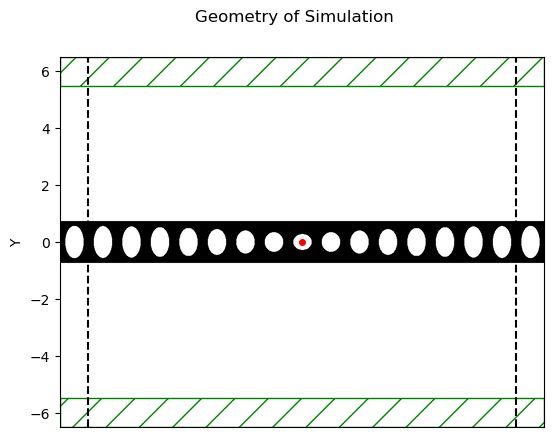

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00215912 s
Working in 2D dimensions.
Computational cell is 17 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.6

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.09446599623918565, -9.320471254431864e-05, 506.76620130268236, 0.003986487942288716, 0.00396928054789775-0.00036999735957687473i, 4.810350729006879e-06+0.0i
harminv0:, 0.11578387805881041, -1.5908773306645323e-06, 36389.945292150784, 0.016078984844290656, -0.013799136672328884-0.008253337550428721i, 4.213028631637355e-07+0.0i
harminv0:, 0.13396881603294564, 1.3513442801935074e-06, -49568.72130829673, 0.03856472279211725, -0.004289633660497566+0.03832540785290581i, 1.386668606696788e-07+0.0i
harminv0:, 0.15131217278699136, 4.5817605757195887e-07, -165124.48684993433, 0.082190282736969, 0.08154686786402716-0.010264059525830883i, 1.2178757879690555e-07+0.0i
harminv0:, 0.1674964918986427, -1.6336086814472712e-07, 512657.9388346899, 0.15784727109758492, -0.04026280114551422-0.15262590814429655i, 3.1930641205988193e-08+0.0i
harminv0:, 0.1806236746595097, -2.7233571056118375e-07, 331619.5189520147, 0.26832758231975895,

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

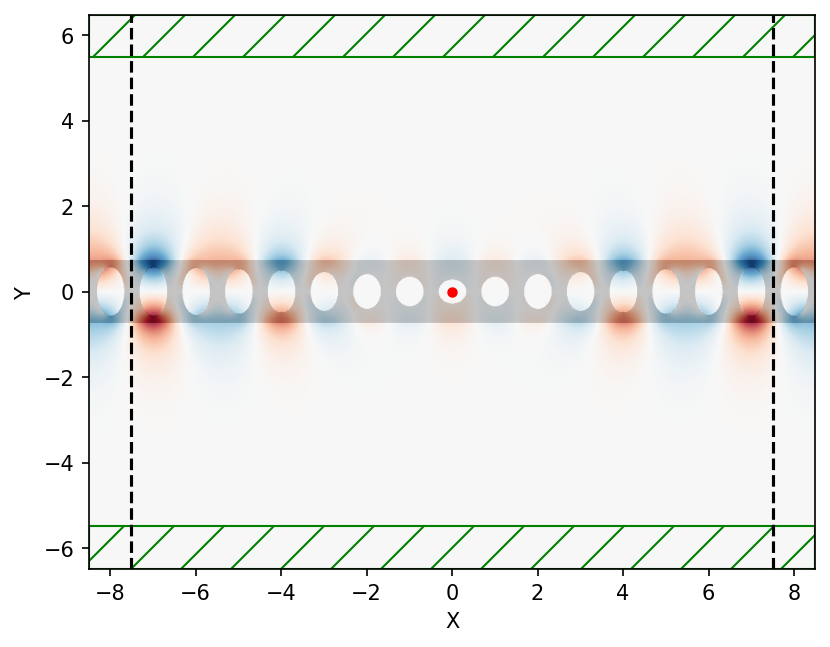

     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

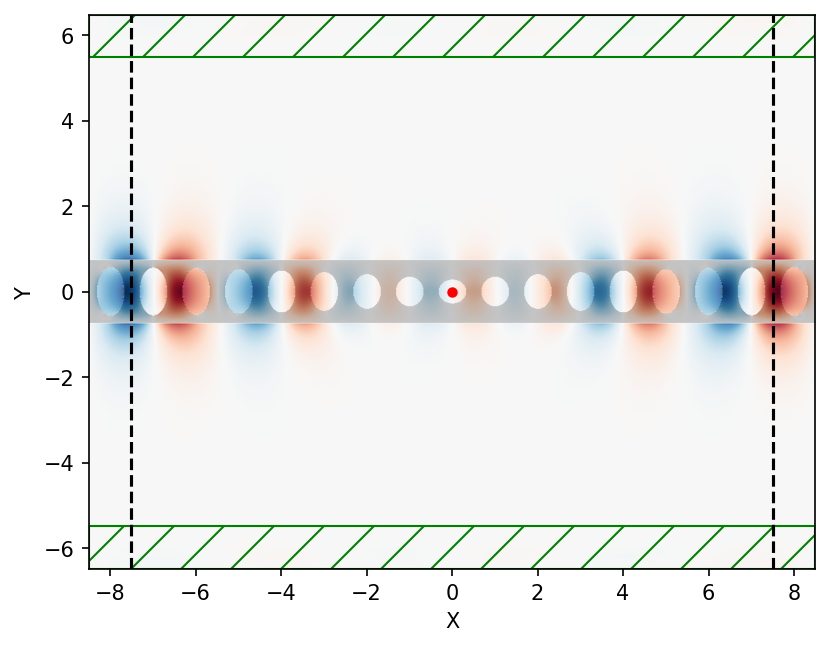

     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

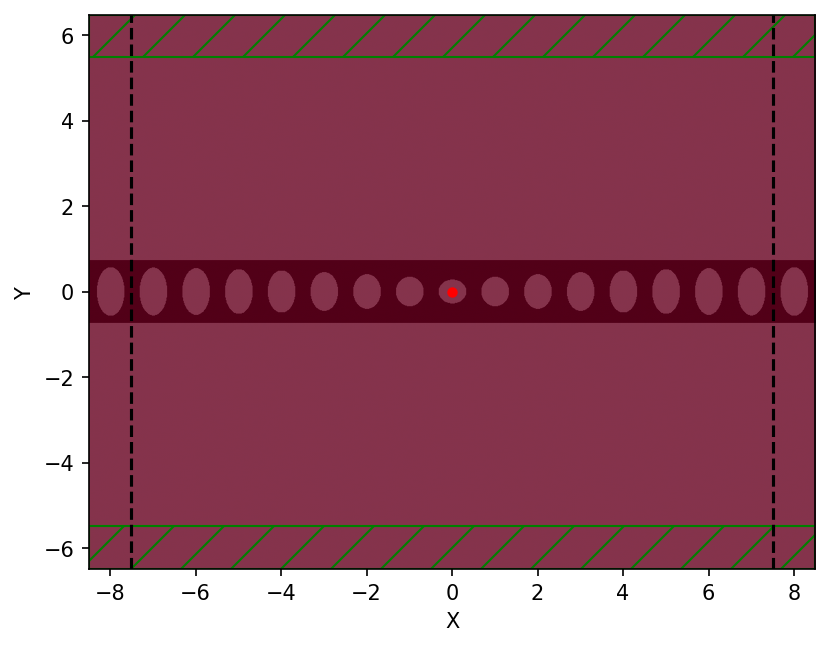

     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

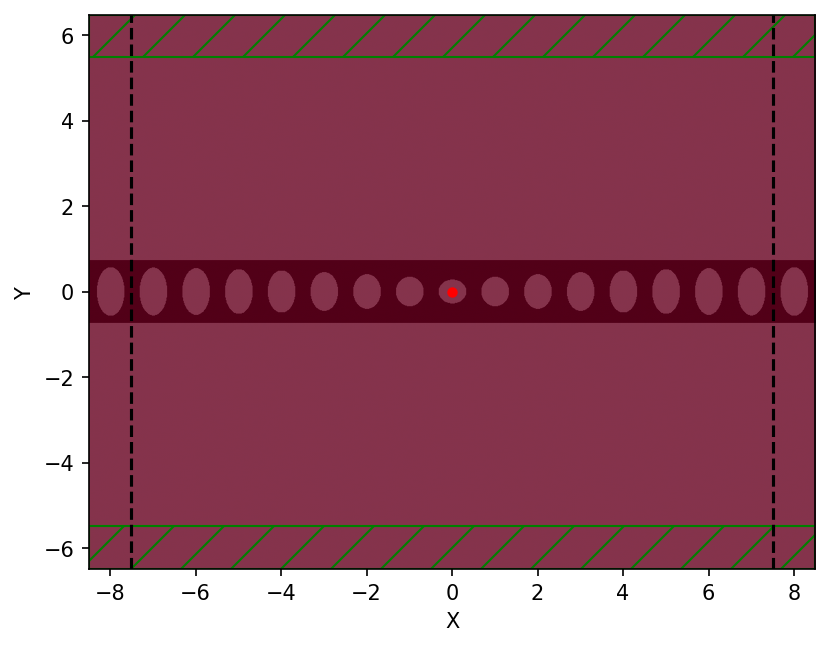

     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

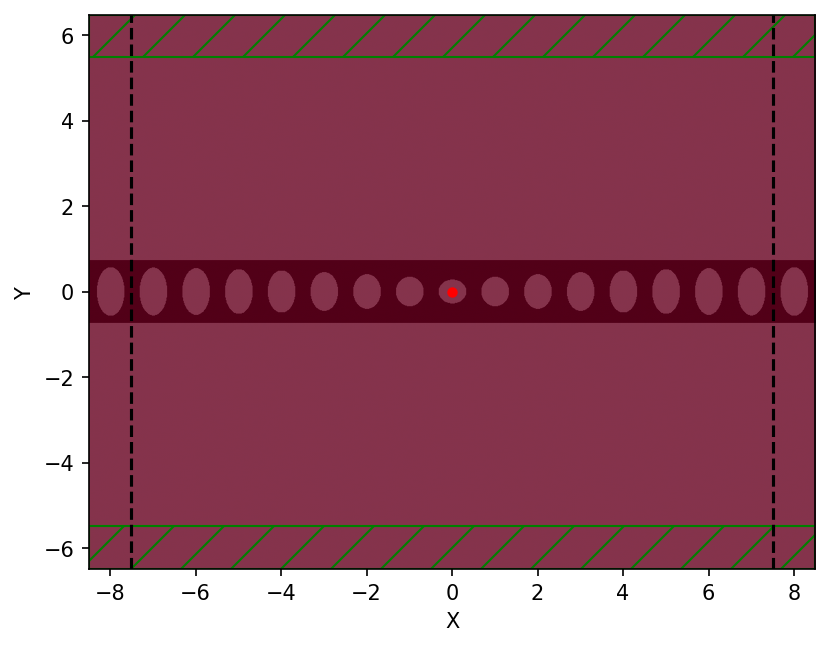

     block, center = (0,0,0)
          size (17,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

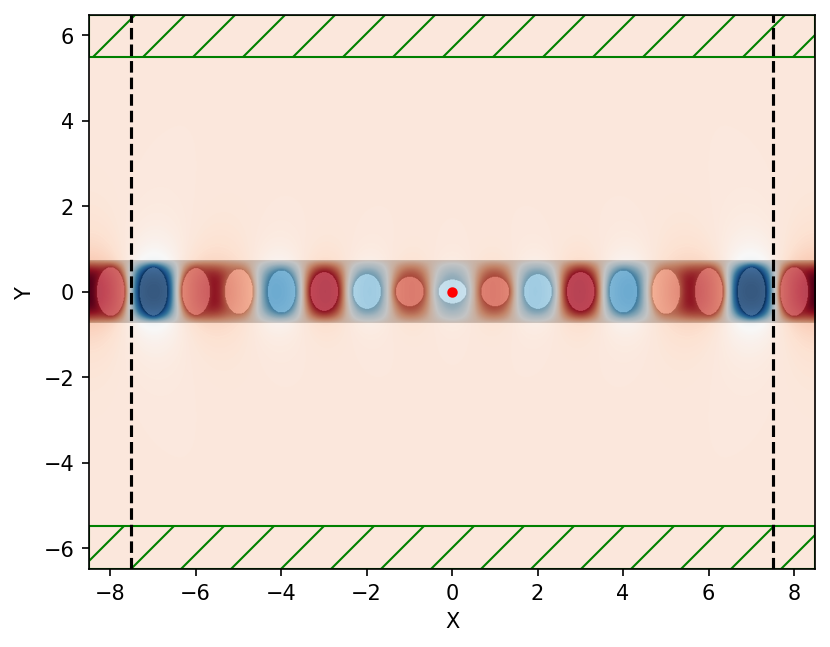

Running for 2 mirrors
     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

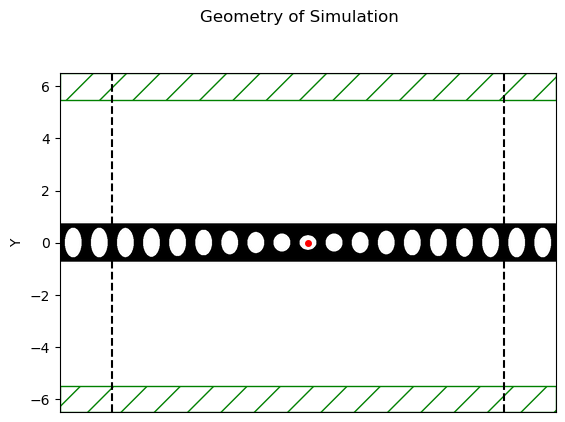

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00116086 s
Working in 2D dimensions.
Computational cell is 19 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.6

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.08872033460241795, -0.00013830589486155085, 320.7395270144855, 0.0005529804175937707, 0.0005289006473044648-0.00016140460812225622i, 3.323492420155526e-05+0.0i
harminv0:, 0.1099672196206742, -0.00012737519546548282, 431.66653923005765, 0.011062279100754586, -0.004638763317239936-0.010042703509992756i, 6.209912263747474e-07+0.0i
harminv0:, 0.12692796787887942, -8.41424179102464e-06, 7542.448329347499, 0.025674971241878355, -0.019666393843290917+0.0165056687677855i, 3.0621372208144893e-07+0.0i
harminv0:, 0.14279431242047602, -1.0340241911641374e-06, 69047.85866746194, 0.05181339799446662, 0.03754926009362863+0.03570267886523399i, 6.651852279382235e-08+0.0i
harminv0:, 0.1580084454567173, 2.2329708425330936e-07, -353807.6773037298, 0.09693933717026018, 0.06479706883038139-0.07210114397150856i, 3.472978928957007e-08+0.0i
harminv0:, 0.17193431136926113, -8.667817364054911e-07, 99179.7035792804, 0.17128137159853254, -0

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

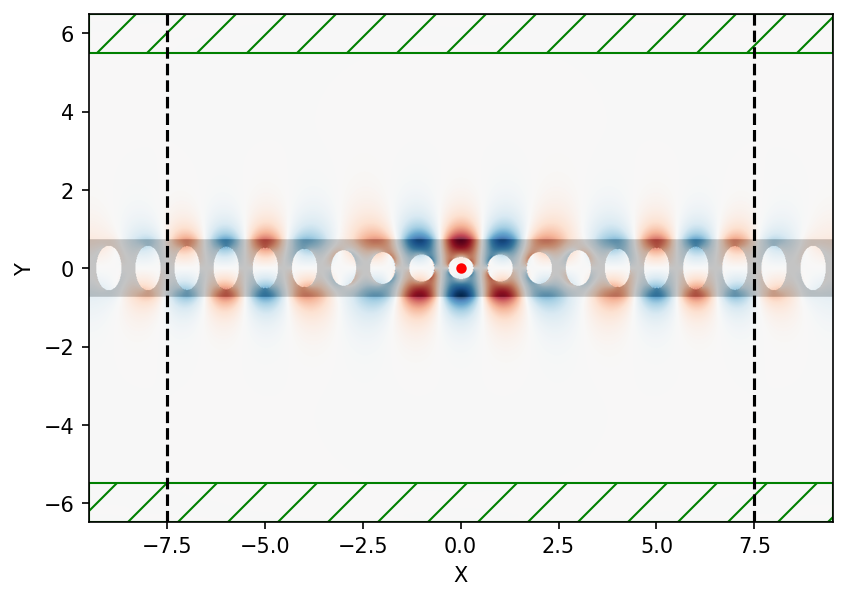

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

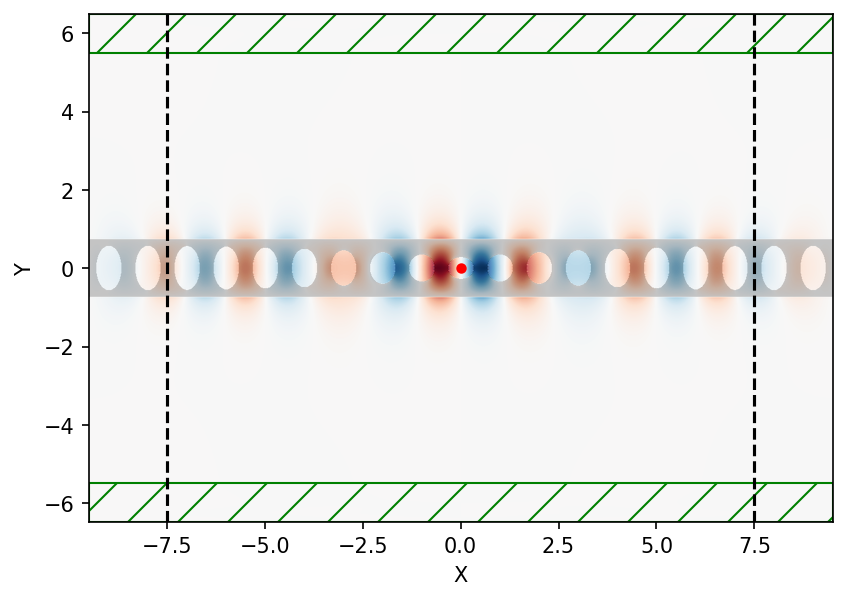

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

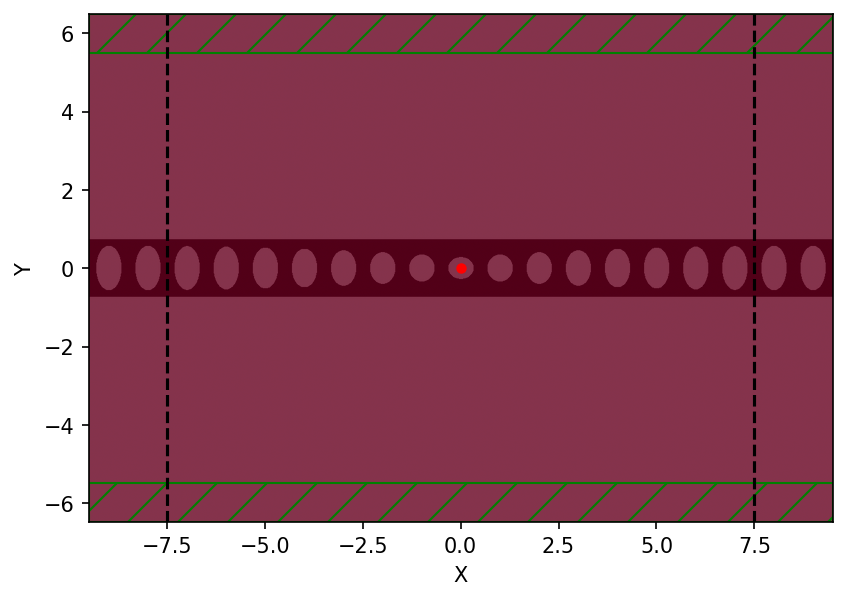

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

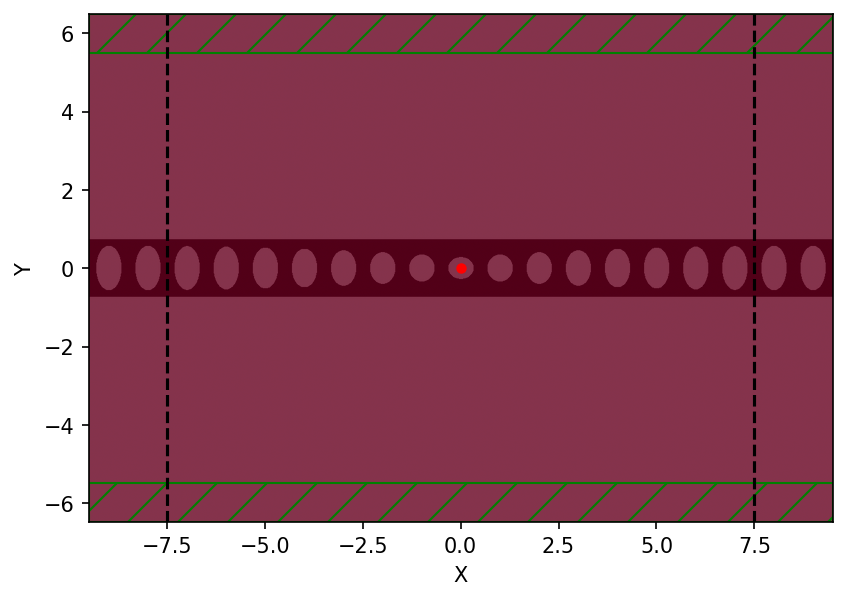

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

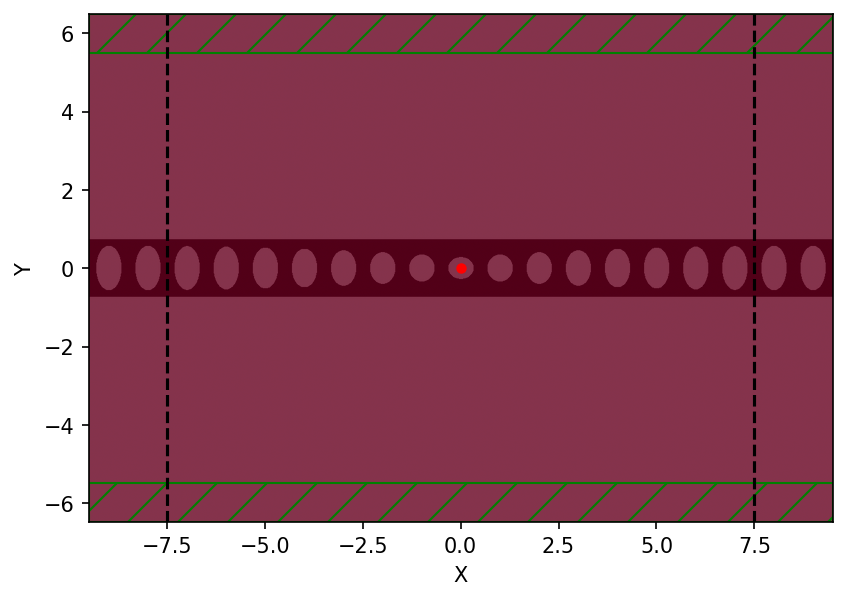

     block, center = (0,0,0)
          size (19,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

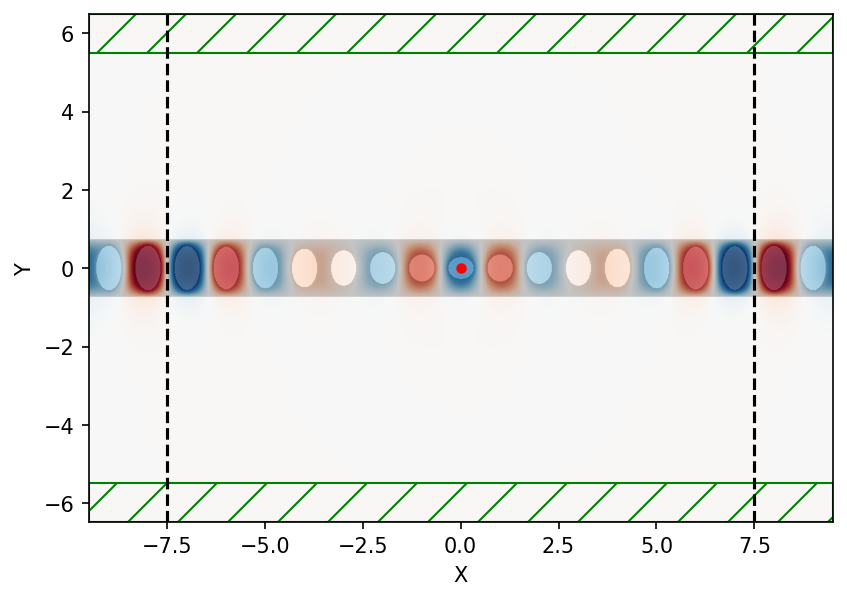

Running for 3 mirrors
     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

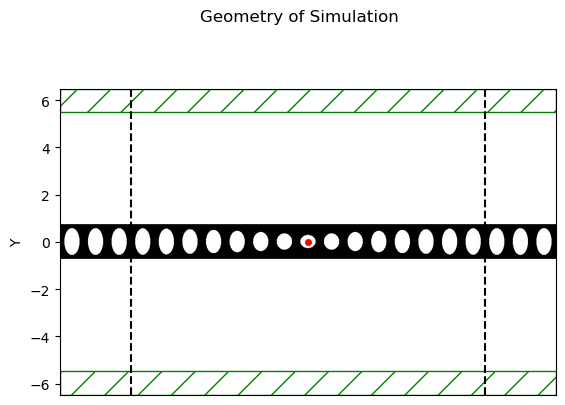

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.00493908 s
Working in 2D dimensions.
Computational cell is 21 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.6

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.08426705709733198, 0.00020788787180630775, -202.67429832521654, 0.000989726366842736, 0.0004160807646686409+0.0008980173041186238i, 1.4117275537248068e-06+0.0i
harminv0:, 0.0979645684675717, 0.00020234267684243696, -242.07589322309929, 7.0426837607962e-07, -7.745092703576476e-08-6.999966424541804e-07i, 0.00043461832231369104+0.0i
harminv0:, 0.10503803952293003, -0.00015751596474575618, 333.4202970869338, 0.007446210941160578, 0.0013553518742662968-0.007321822087239101i, 1.2530957991016054e-06+0.0i
harminv0:, 0.1210551814152367, -1.803519991324591e-05, 3356.0809416458983, 0.017582925694948202, -0.017527595284902785+0.0013938003884069637i, 2.8192845777314266e-07+0.0i
harminv0:, 0.13572174779207935, 1.9612867222667406e-07, -346001.80139704427, 0.03429739558940532, 0.002419144106959014+0.034211972845860916i, 8.357861469768784e-08+0.0i
harminv0:, 0.14984145934283927, -1.887548738100027e-07, 396920.7690331404, 0.06305

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

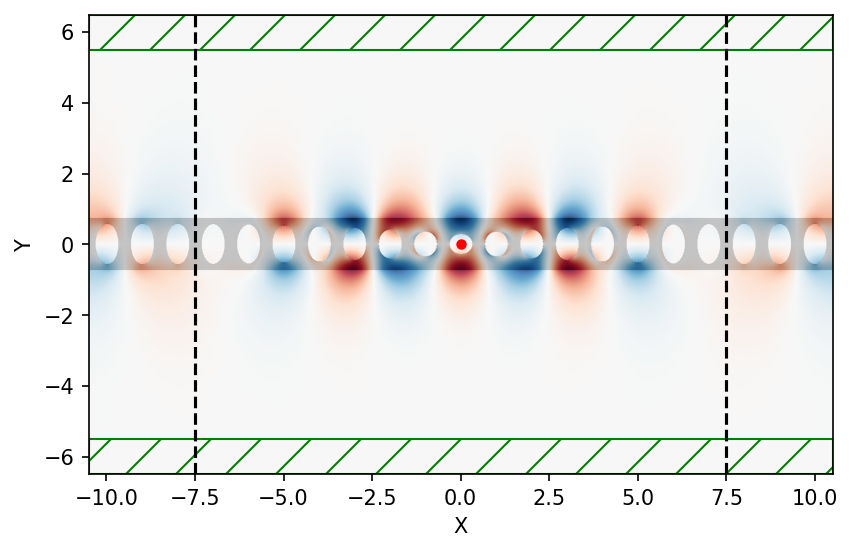

     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

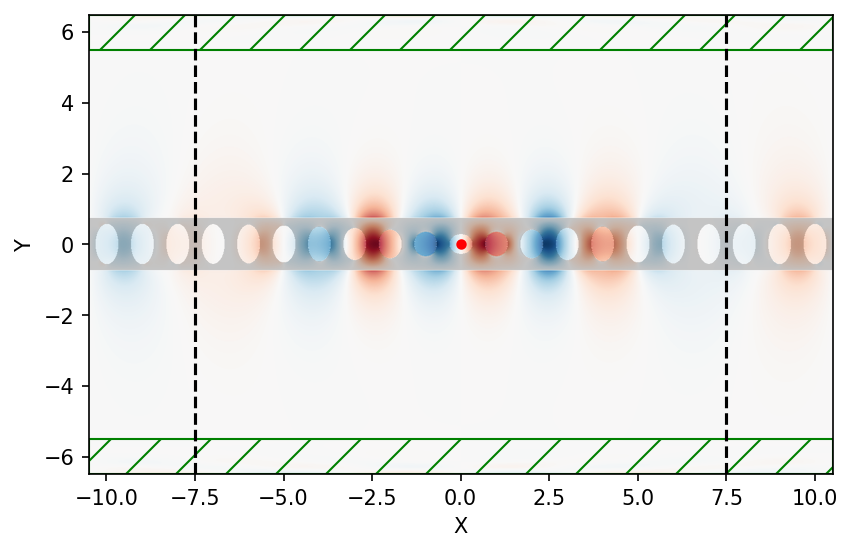

     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

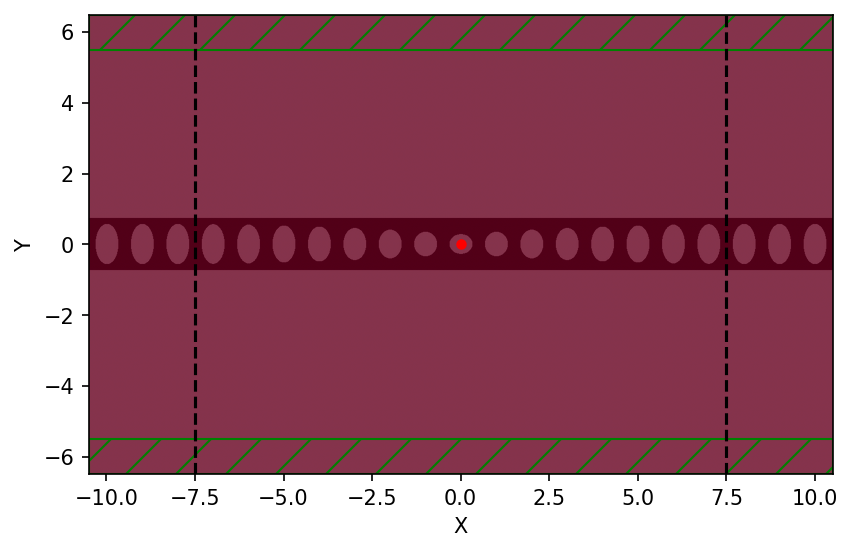

     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

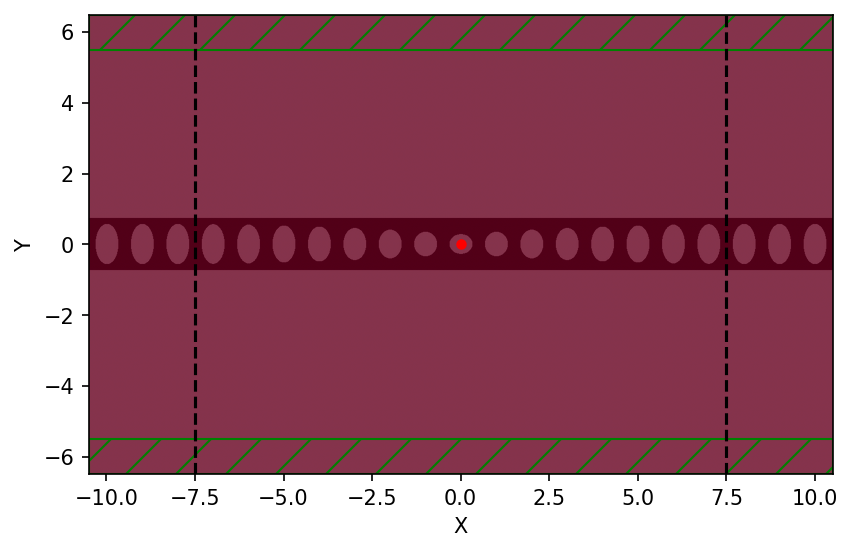

     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

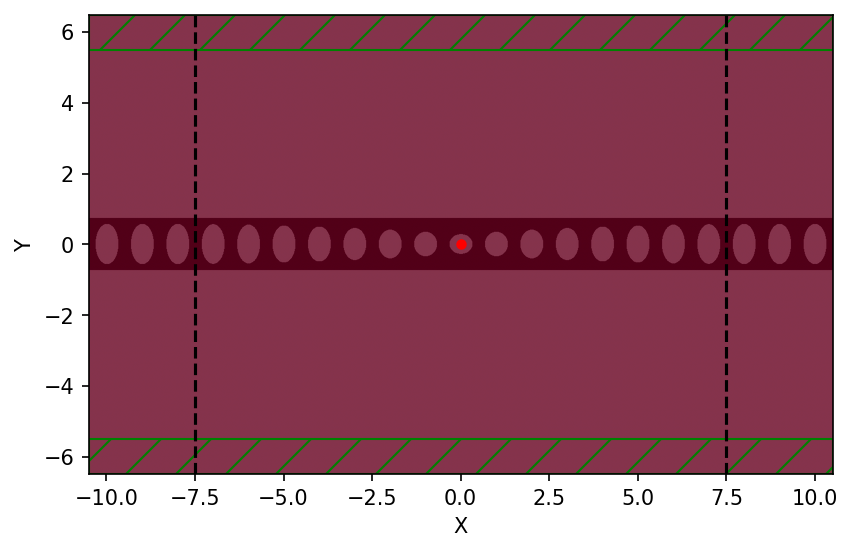

     block, center = (0,0,0)
          size (21,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

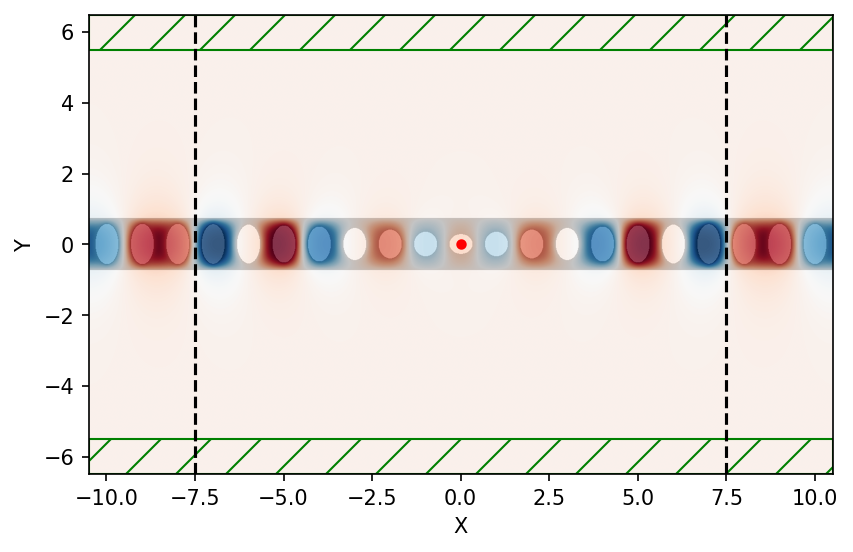

Running for 4 mirrors
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

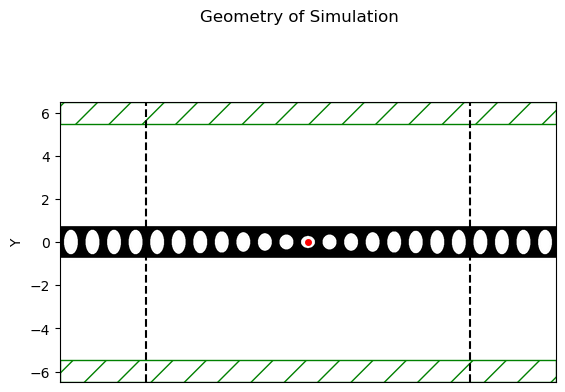

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000660181 s
Working in 2D dimensions.
Computational cell is 23 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, 0.10049000644435709, -0.00012831854873837265, 391.56461568640833, 0.005814952937660904, 0.003171669432590852-0.004873827107887599i, 3.817625646559381e-06+0.0i
harminv0:, 0.11601218389979476, -1.907079031333221e-05, 3041.619722982632, 0.012424020486104751, -0.01103216137640098-0.005713816623256034i, 1.5066984472474474e-07+0.0i
harminv0:, 0.12974298256887798, 1.944427656761124e-06, -33362.7692749942, 0.02402684170302185, -0.012532341877013053+0.020499500708547388i, 4.670228684447423e-08+0.0i
harminv0:, 0.14288472997695953, 1.0236403914655237e-07, -697924.4428426401, 0.0429538701542545, 0.03166773790213143+0.029020498572396445i, 6.882514171540847e-08+0.0i
harminv0:, 0.15557771471525636, -2.2095567748191686e-06, 35205.63863492237, 0.07368263975168612, 0.061459383458572346-0.04064327232973398i, 1.1288999359235498e-07+0.0i
harminv0:, 0.16751972339653162, -7.0874530719356e-08, 1181804.8154693572, 0.11835983042103922, -0.030541741116567853-0.11435143858677821i, 2.308906165569967e-08

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

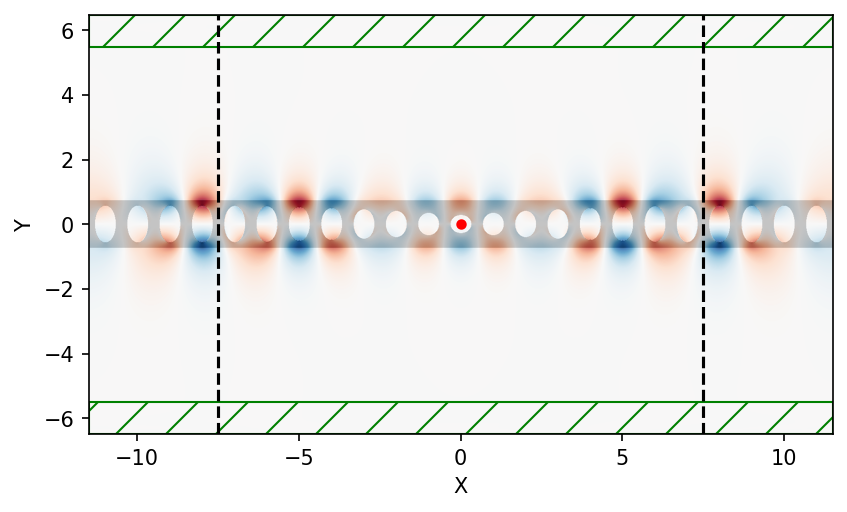

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

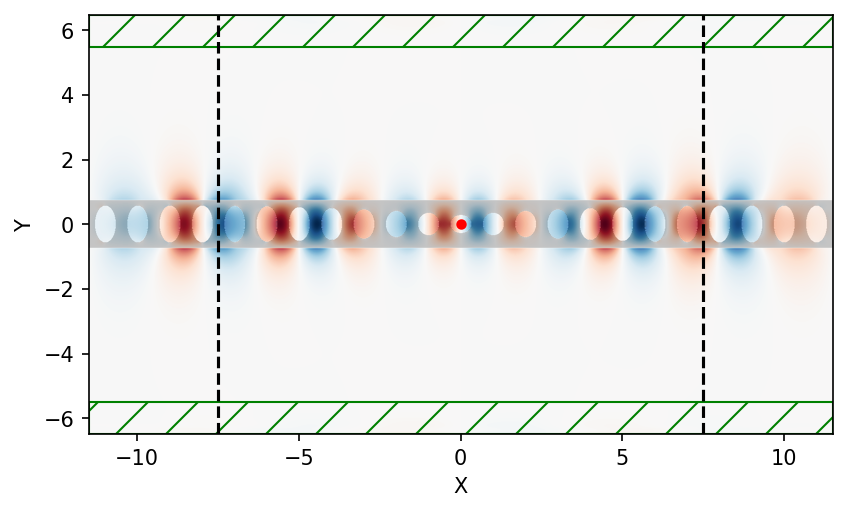

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

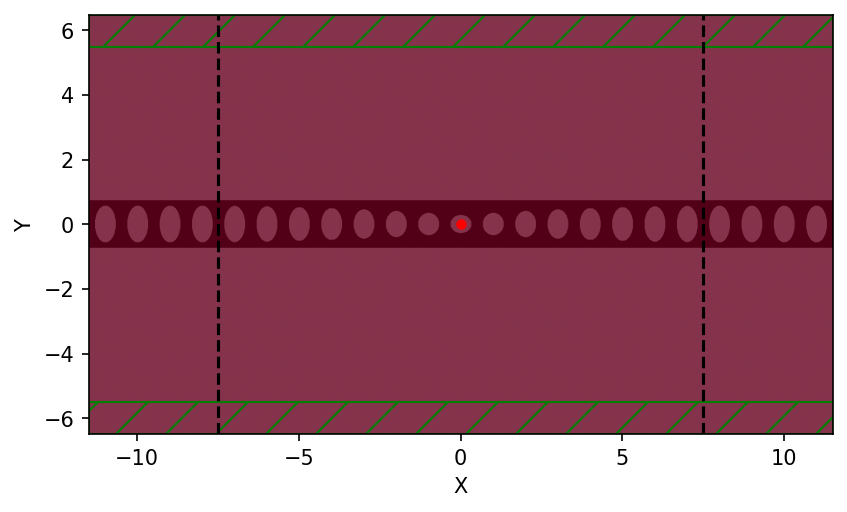

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

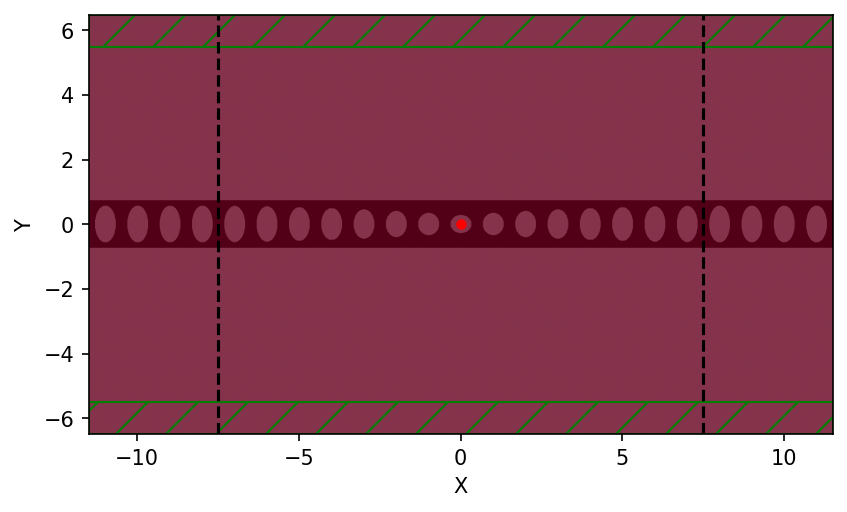

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

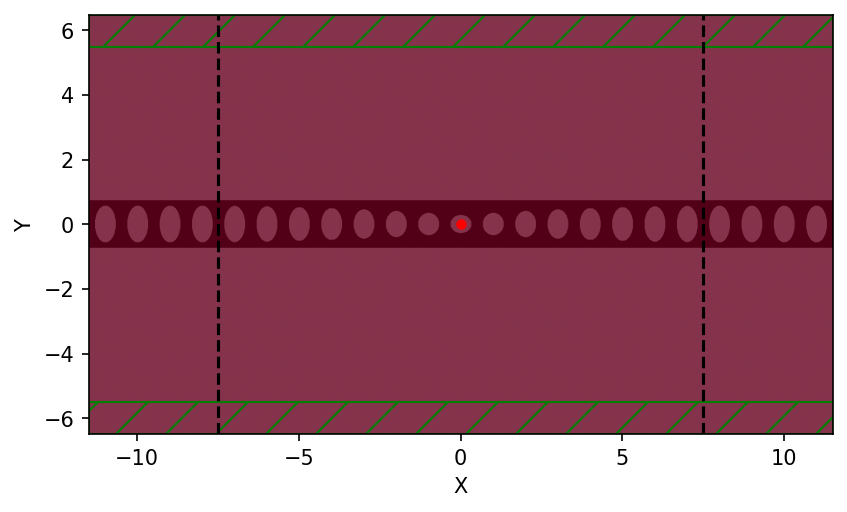

     block, center = (0,0,0)
          size (23,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

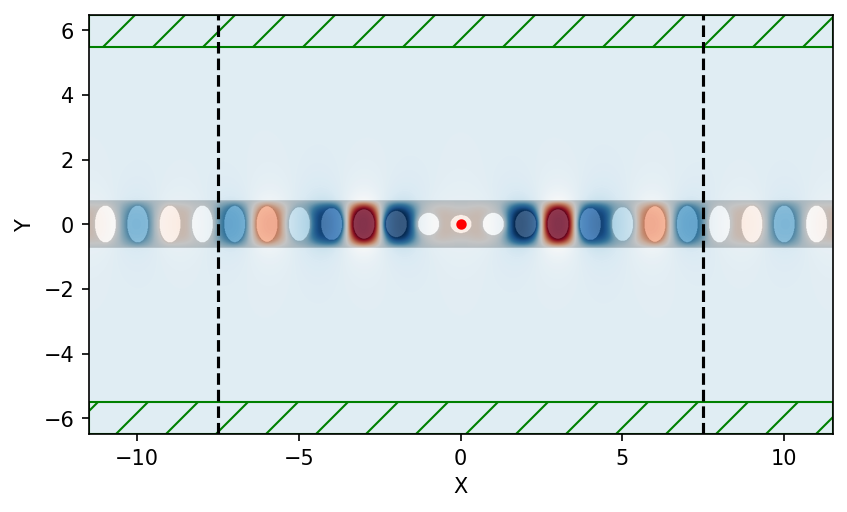

Running for 5 mirrors
     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

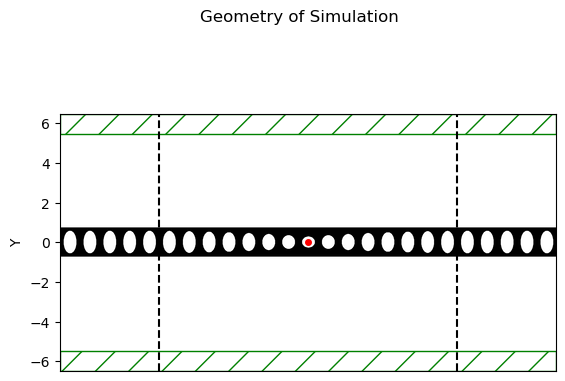

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000524998 s
Working in 2D dimensions.
Computational cell is 25 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.09616156716061464, -6.749748659203532e-05, 712.3344291457043, 0.0031289268251442565, 0.0027579590566555127-0.001477783786255334i, 7.07958470279566e-07+0.0i
harminv0:, 0.11154146153174944, -4.5023285851103325e-05, 1238.7085862705426, 0.009627696998625564, -0.0055009393805103834-0.00790140591472769i, 8.334679441325684e-07+0.0i
harminv0:, 0.12461673618508173, -1.1965043487645114e-05, 5207.533775943176, 0.017741299355501925, -0.015934708256741377+0.0077999215120455635i, 1.455172128893809e-07+0.0i
harminv0:, 0.13692215132001243, -2.7454427184248524e-06, 24936.260807977993, 0.030828588046571532, 0.00607474641019028+0.030224150889596443i, 8.75455004454295e-08+0.0i
harminv0:, 0.14883255710465967, 2.2657567345765892e-06, -32843.89600026337, 0.0505736196957453, 0.050149841014581795+0.006533334167333467i, 1.24421130451668e-07+0.0i
harminv0:, 0.16029366044791823, 4.081814663697887e-07, -196350.97824689263, 0.081451215007119

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

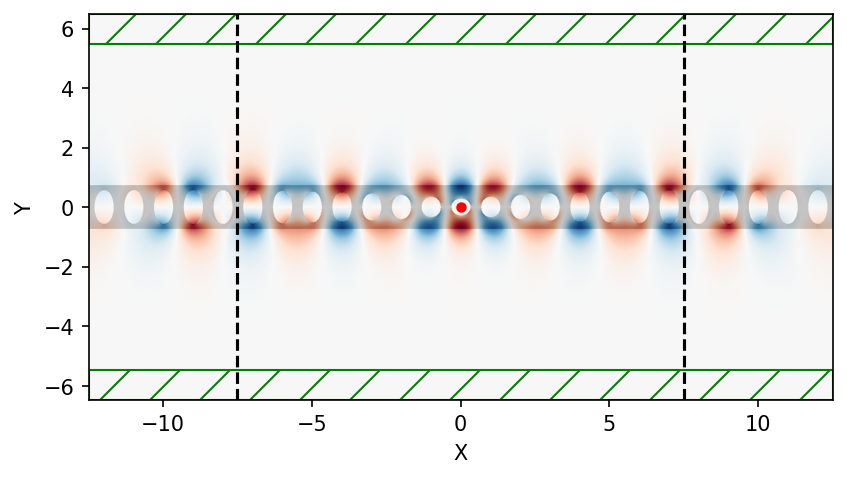

     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

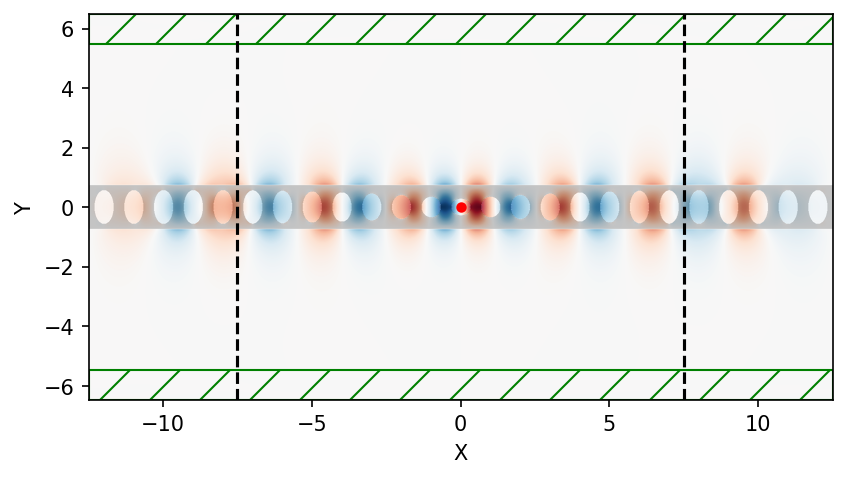

     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

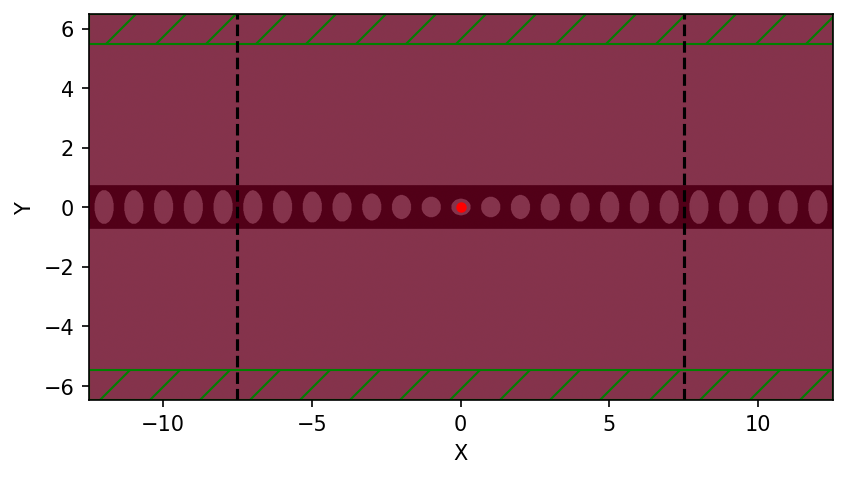

     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

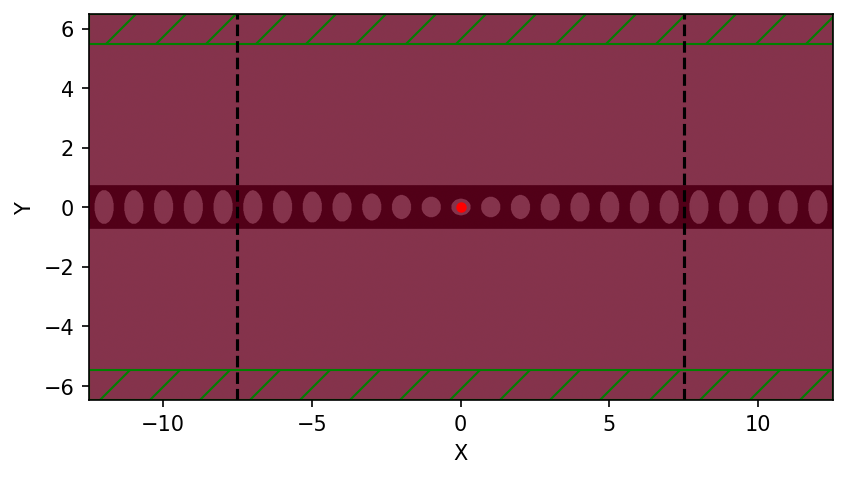

     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

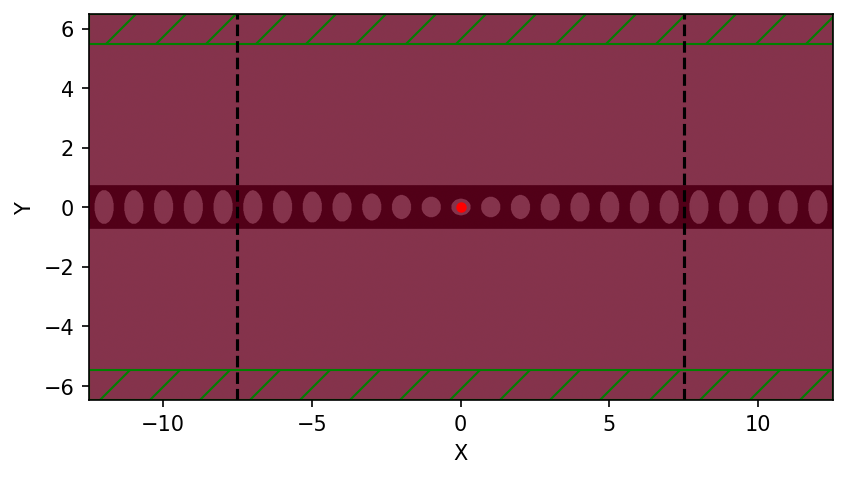

     block, center = (0,0,0)
          size (25,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

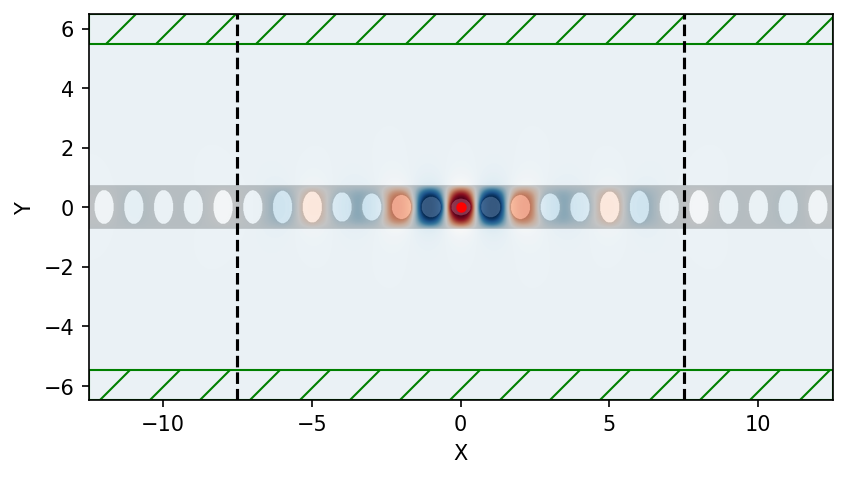

Running for 6 mirrors
     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

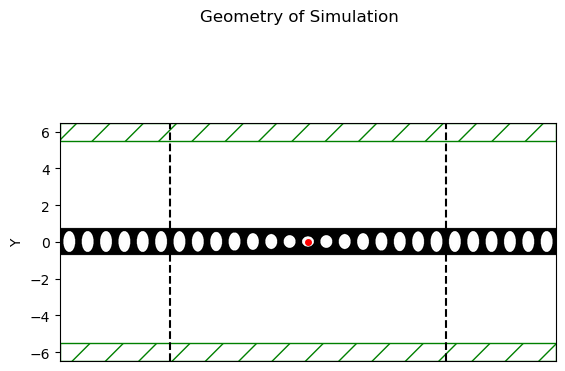

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000752926 s
Working in 2D dimensions.
Computational cell is 27 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.09164403327771159, -0.0001835528078001337, 249.63942087309448, 0.0010365605442025528, -0.00014768101985479143-0.0010259863927811817i, 3.596697287503642e-05+0.0i
harminv0:, 0.10761030408583298, -0.00010805648395011297, 497.9354322481658, 0.00756325849592787, 0.00018641227976001602-0.007560960887227216i, 3.527502489922891e-06+0.0i
harminv0:, 0.1201368693349167, -4.162299612861942e-05, 1443.1549925392346, 0.014298574968552568, -0.01427281234559389-0.0008579474801995163i, 1.8835804092334338e-06+0.0i
harminv0:, 0.13175739653968854, -3.440128502678834e-07, 191500.69021707884, 0.022457635629935552, -0.008608950967946699+0.020742019219893718i, 1.117798771071557e-06+0.0i
harminv0:, 0.1429565927992346, -2.5246641558761377e-06, 28312.00190855171, 0.03723757335897281, 0.027032059845008338+0.02561063470905728i, 6.724940777577916e-07+0.0i
harminv0:, 0.1538297978565416, -1.4019774829350246e-06, 54861.722006583375, 0.0584744579

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

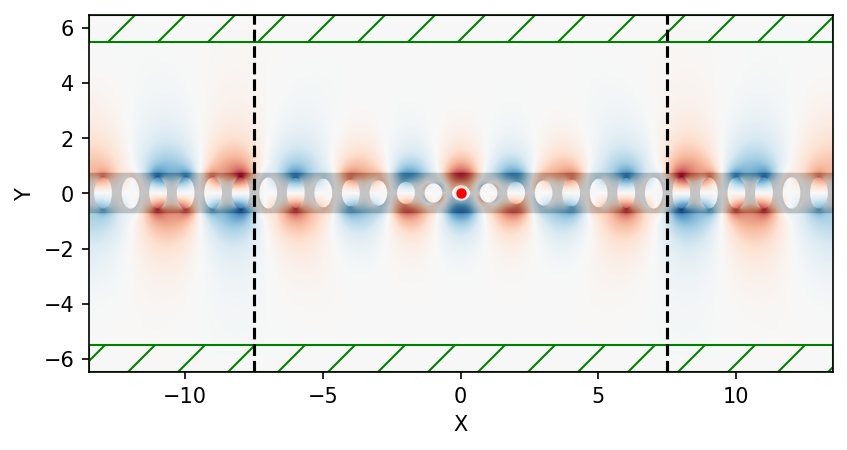

     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

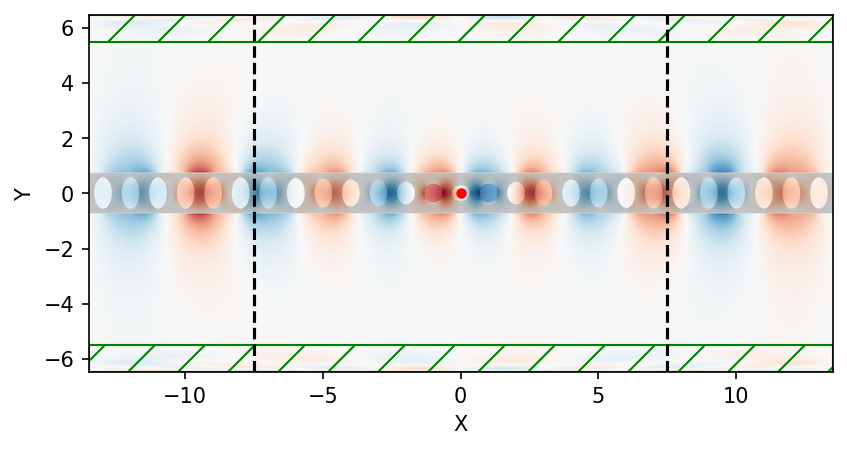

     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

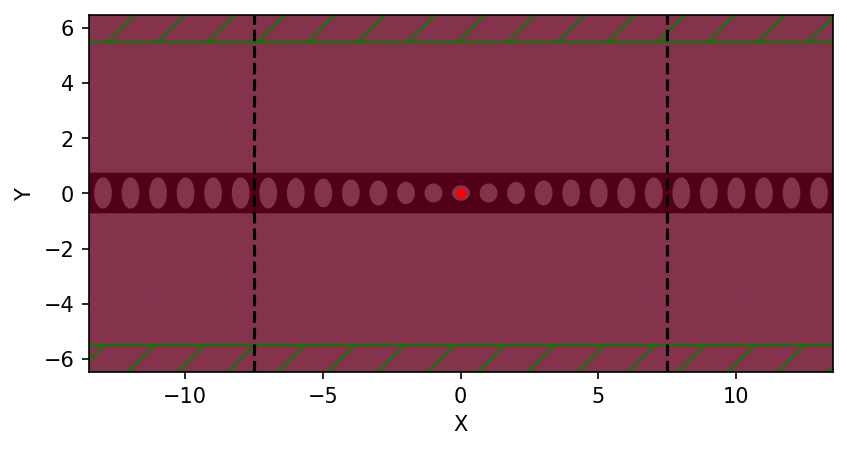

     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

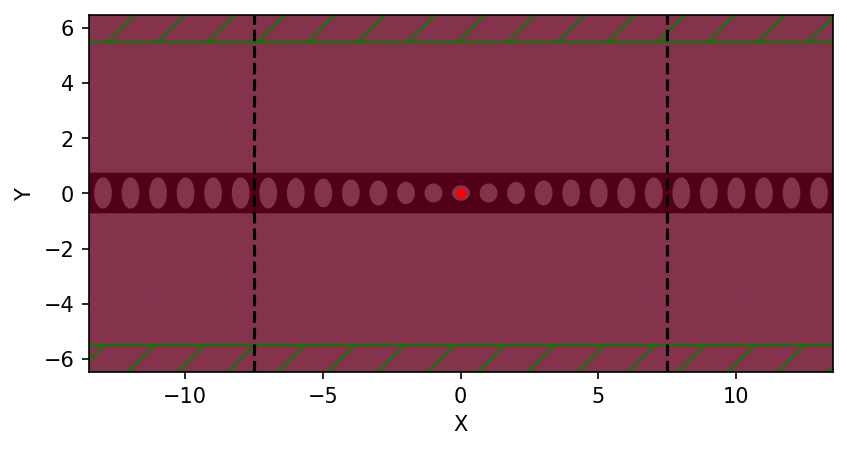

     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

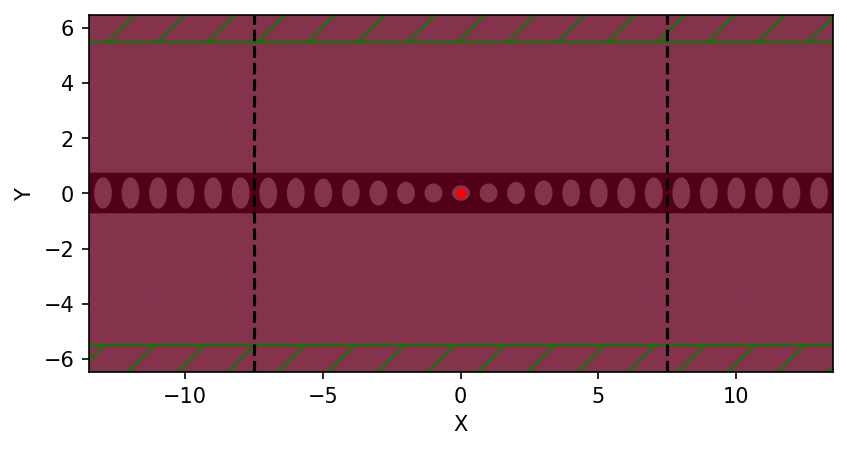

     block, center = (0,0,0)
          size (27,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

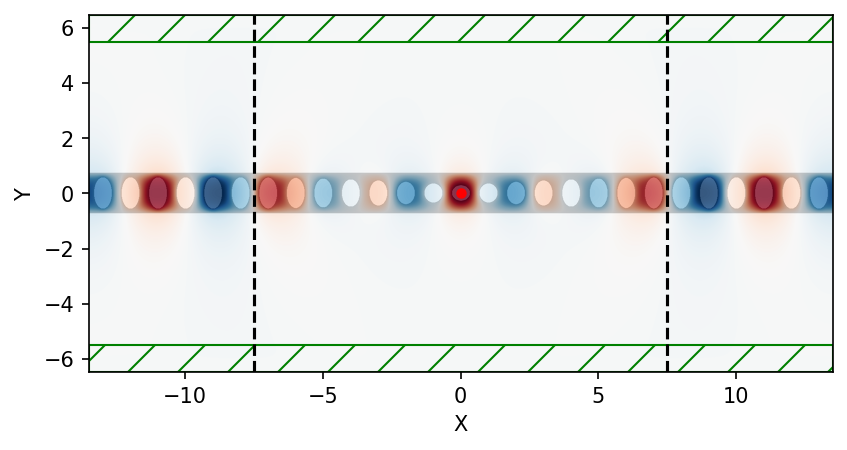

Running for 7 mirrors
     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

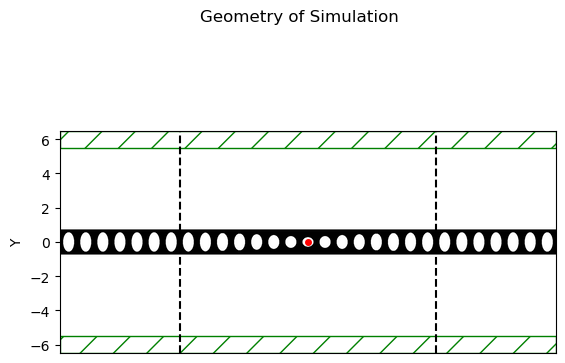

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000624895 s
Working in 2D dimensions.
Computational cell is 29 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.08898196139744537, -0.0006138461437679979, 72.4790424284851, 0.001830120868264428, 0.001063075987451013+0.0014897019290321125i, 1.7100022248804198e-05+0.0i
harminv0:, 0.10387882757480733, -4.742012483466366e-05, 1095.3031854828955, 0.005247060668265317, 0.001307554957445914-0.0050815298572098825i, 3.5213546580379794e-07+0.0i
harminv0:, 0.1161346136275192, -5.1211582702724825e-05, 1133.8705767175986, 0.010726832082992688, -0.009484147039534398-0.00501157474943876i, 1.3218611369129364e-06+0.0i
harminv0:, 0.12720260847505255, -6.053144321295096e-07, 105071.51467341605, 0.01705299365205742, -0.012523361665983283+0.011574541247068547i, 6.353514749992833e-08+0.0i
harminv0:, 0.1377987752420283, 3.936214680636322e-06, -17503.971000351023, 0.02708637481287718, 0.00748568850043957+0.026031445756585513i, 3.4396823205766767e-07+0.0i
harminv0:, 0.14808931833944344, 5.503172570501548e-07, -134549.04097796345, 0.04265299774536

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

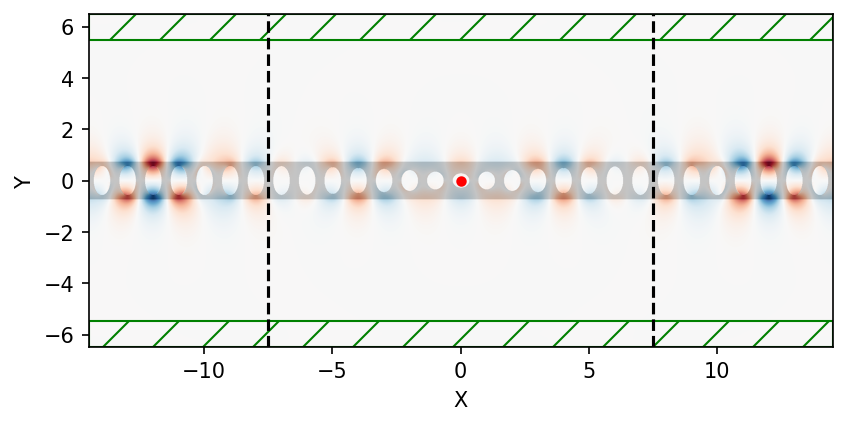

     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

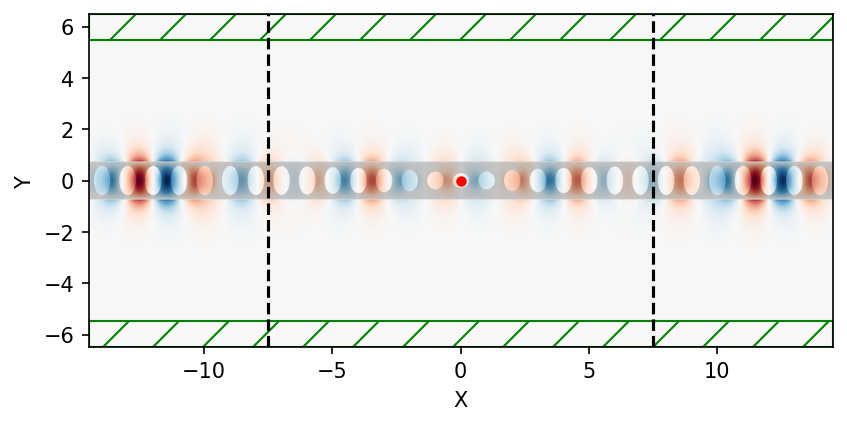

     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

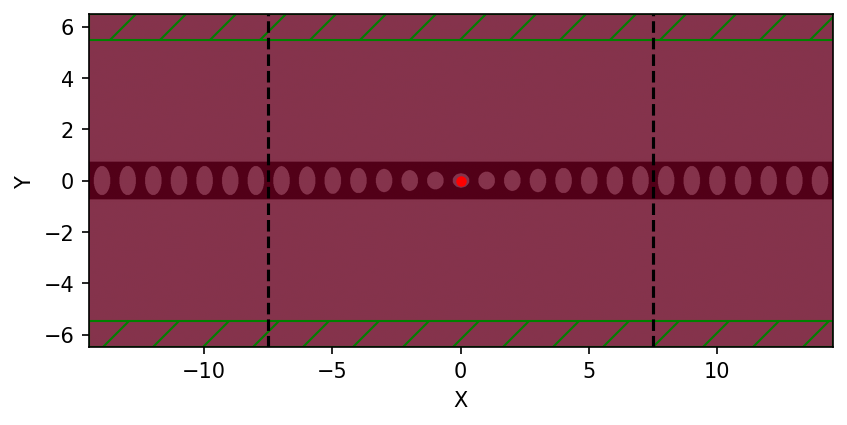

     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

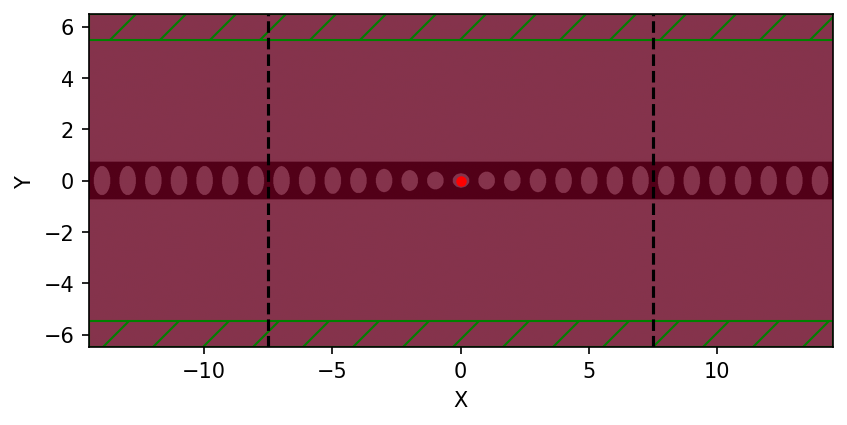

     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

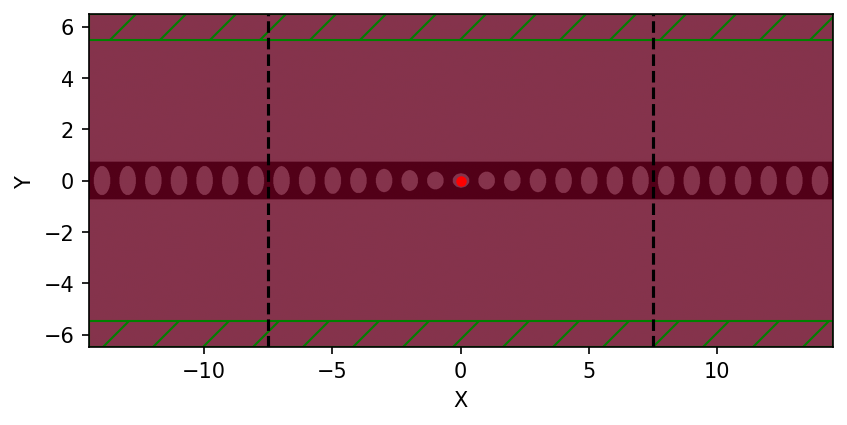

     block, center = (0,0,0)
          size (29,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

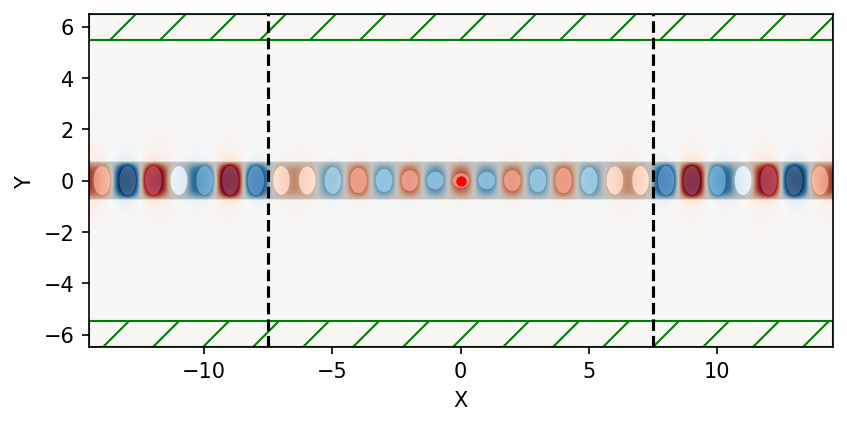

Running for 8 mirrors
     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

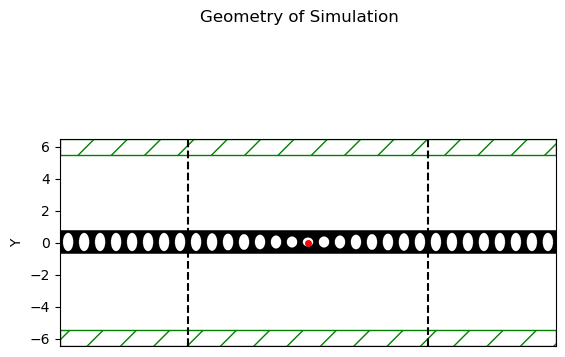

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000638008 s
Working in 2D dimensions.
Computational cell is 31 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.08551888972624702, 0.0002164681013972078, -197.5323134777356, 0.0006573306587456028, 0.0003129524856156585+0.0005780521919981873i, 5.086222798040681e-06+0.0i
harminv0:, 0.1004097114080282, -2.9604728975686804e-05, 1695.839058187135, 0.0037520413490643137, 0.0019329296344465067-0.003215835398985285i, 2.307653139250884e-06+0.0i
harminv0:, 0.11251950659749403, -6.043857647116381e-05, 930.8583455070194, 0.008203118092979595, -0.005301459651473299-0.006259846005387817i, 9.488229153731085e-07+0.0i
harminv0:, 0.12316135884890743, -3.3713964129450695e-06, 18265.629988809345, 0.013254764444942085, -0.012542234094020506+0.0042873236898665i, 2.7699580882564054e-07+0.0i
harminv0:, 0.1332313034070718, -4.706876843816097e-06, 14152.835078116745, 0.02135033104145819, -0.004024007385545901+0.02096768943257519i, 1.8428797045700928e-07+0.0i
harminv0:, 0.1429989717889327, -1.6901457829228144e-06, 42303.738894535105, 0.032478983191

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

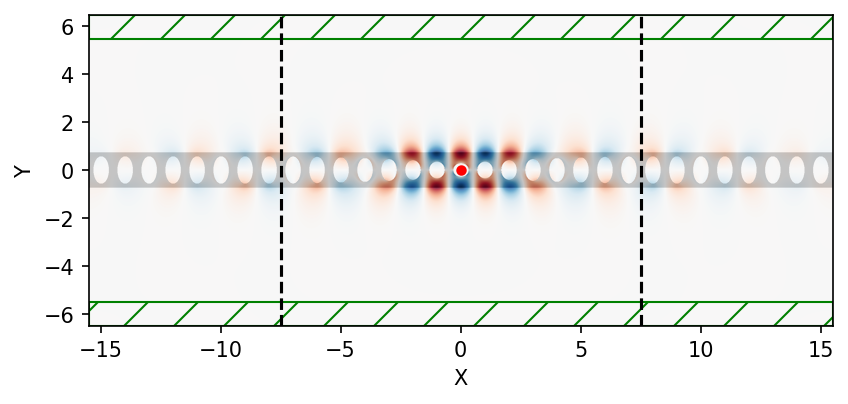

     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

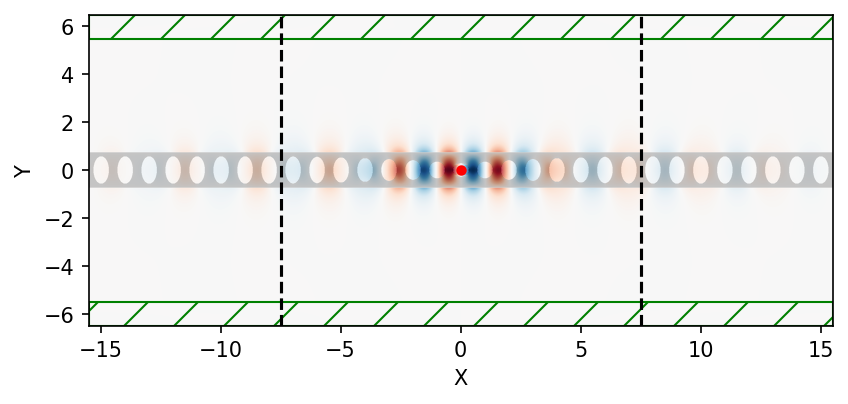

     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

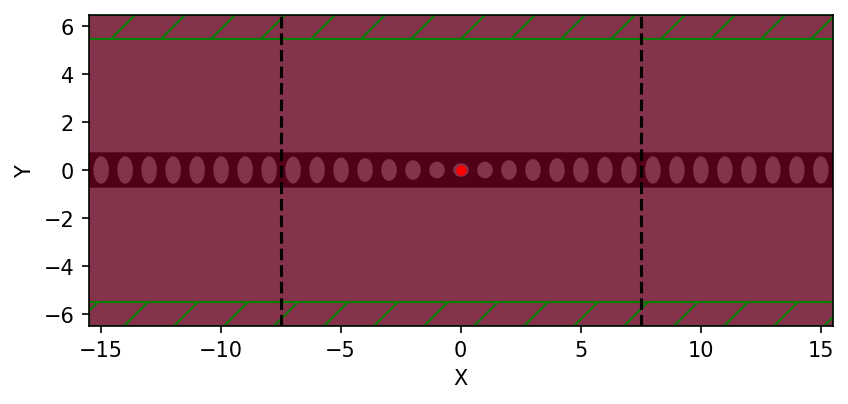

     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

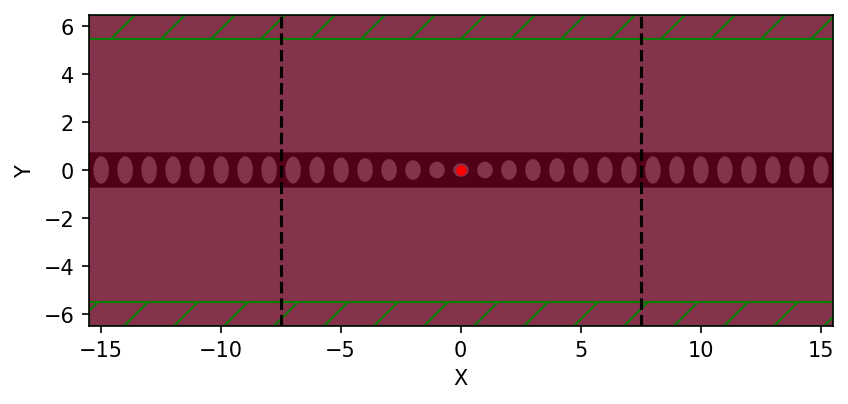

     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

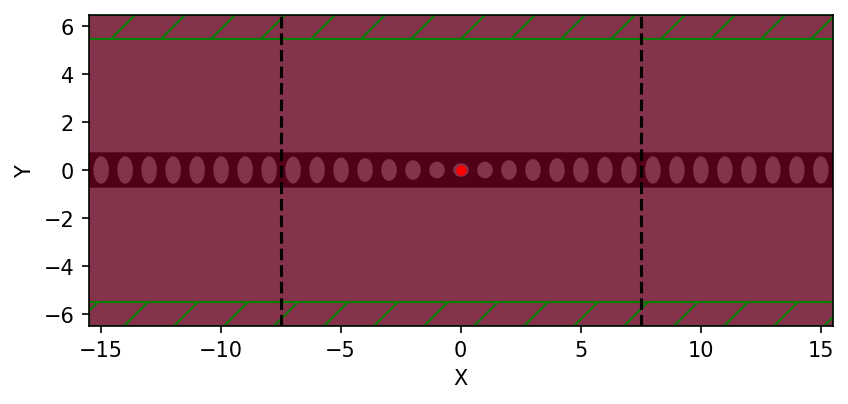

     block, center = (0,0,0)
          size (31,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

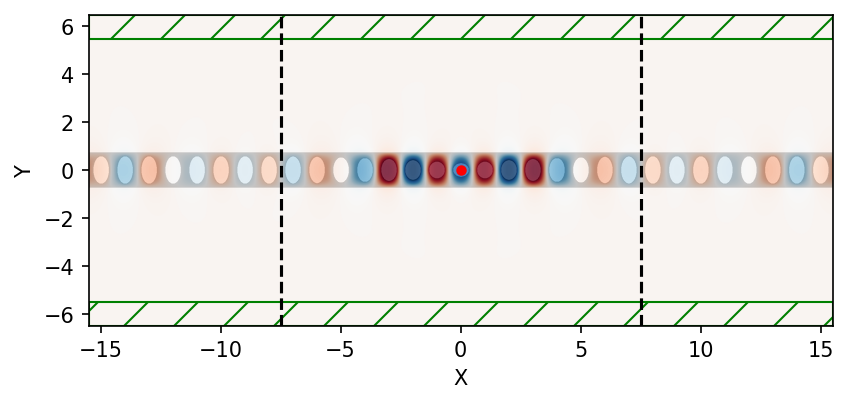

Running for 9 mirrors
     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,

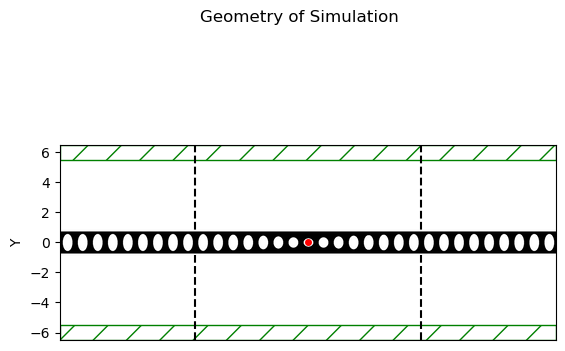

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000391006 s
Working in 2D dimensions.
Computational cell is 33 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.08160237249779796, 0.0006578965654021867, -62.017630725821334, 0.00037989472407871694, 0.0001609069421103292+0.00034413508592346065i, 4.1357900913182184e-06+0.0i
harminv0:, 0.09709810963184229, -3.536052424060933e-05, 1372.9732762323026, 0.0025634075012203124, 0.002124051728937884-0.0014350826701303833i, 8.349216363657356e-07+0.0i
harminv0:, 0.10916414862618815, -4.26413092177557e-05, 1280.0281068848205, 0.006011151675252812, -0.002939405118981228-0.00524345706661184i, 5.791995641524948e-06+0.0i
harminv0:, 0.11955838990201008, -3.777080151803276e-05, 1582.6827217967536, 0.011993043082273815, -0.011800354980992628-0.0021411923537688663i, 5.1369076685281015e-06+0.0i
harminv0:, 0.12916689392468636, -1.748660026935978e-05, 3693.3106474394012, 0.017441450746806923, -0.010501290782175269+0.013925770932393385i, 2.043778295175632e-06+0.0i
harminv0:, 0.1384566573853284, -4.869996471621625e-07, 142152.72864378965, 0.02495

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

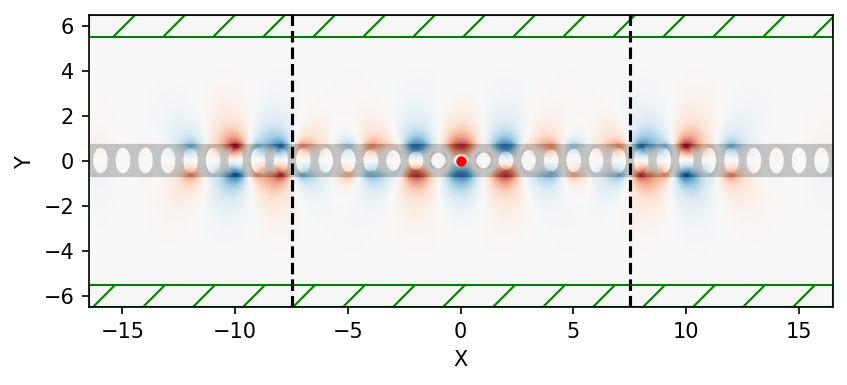

     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

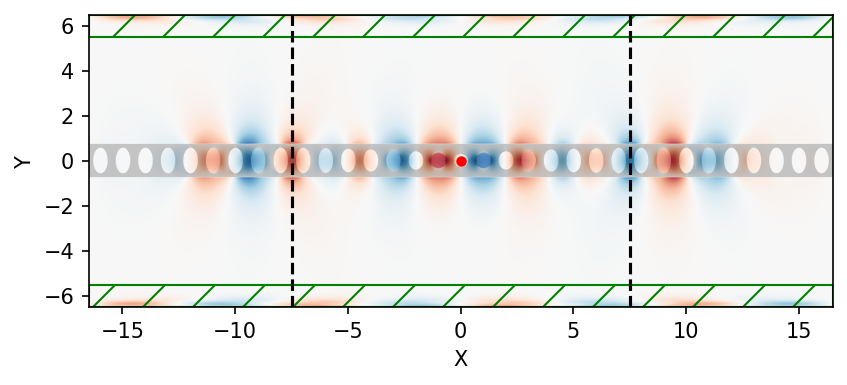

     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

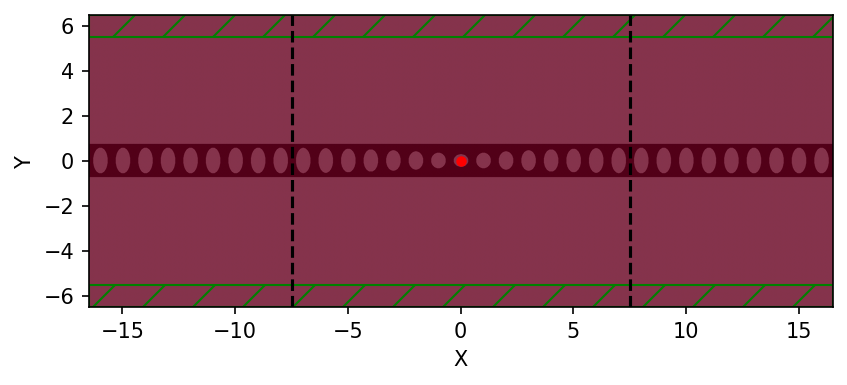

     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

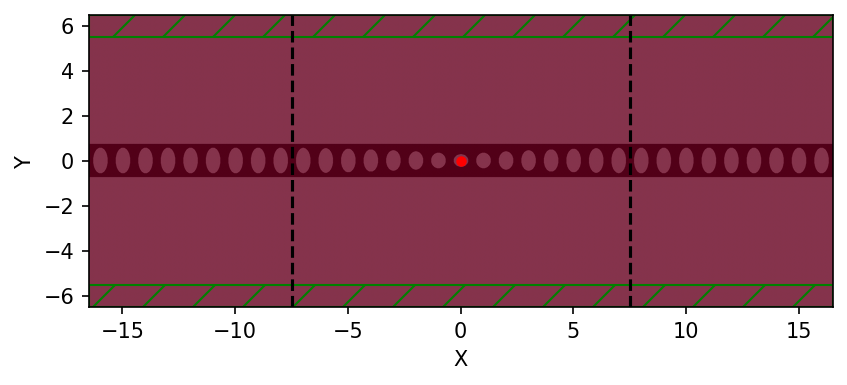

     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

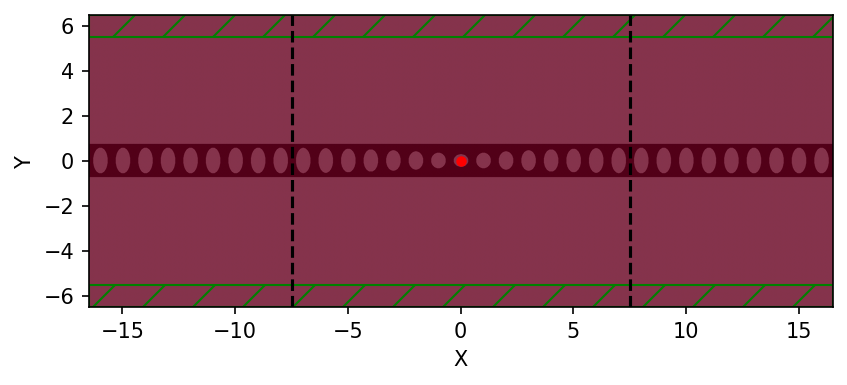

     block, center = (0,0,0)
          size (33,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

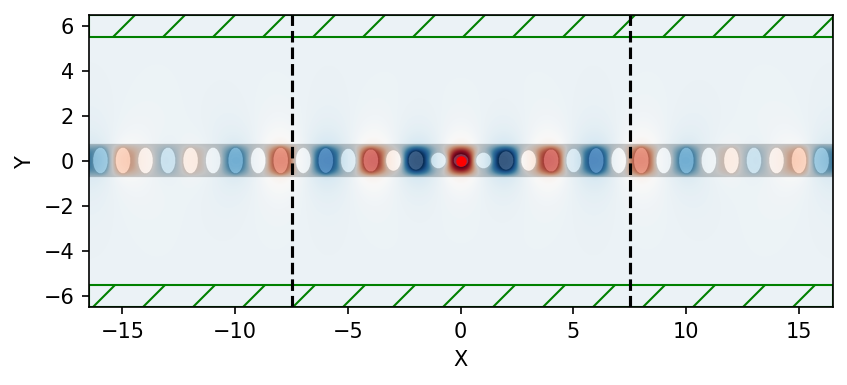

Running for 10 mirrors
     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0

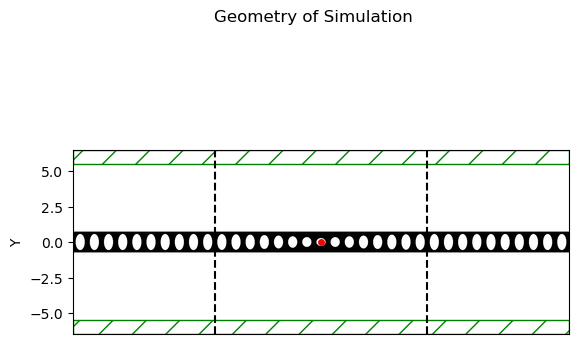

-----------
Initializing structure...
Halving computational cell along direction x
Halving computational cell along direction y
time for choose_chunkdivision = 0.000435829 s
Working in 2D dimensions.
Computational cell is 35 x 12.9688 x 0 with resolution 64
     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.

harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.0939844821811492, -0.0002215389435227395, 212.1172934353691, 0.002067567588558664, 0.002062159947321197-0.000149439234883372i, 4.798236362482561e-06+0.0i
harminv0:, 0.10612512314133168, -7.94055107116451e-05, 668.2478469707019, 0.005629063711310159, -6.477591007342482e-06-0.0056290599842961034i, 1.7994120189115286e-06+0.0i
harminv0:, 0.11621940558524742, -2.6999857642979716e-05, 2152.2225620968384, 0.0086769904290156, -0.007527796753248437-0.004315372399574644i, 8.124642946564426e-07+0.0i
harminv0:, 0.12549157887042053, 2.661102544519618e-06, -23578.86942930158, 0.012813051933996247, -0.010693118873347243+0.007059143618297475i, 5.543310694883804e-07+0.0i
harminv0:, 0.1343822461053099, 3.445840591855147e-06, -19499.19657092468, 0.019381281344859783, -0.0013629137329516598+0.01933330113366938i, 9.170203451834143e-08+0.0i
harminv0:, 0.1430366248797037, -6.992446160684638e-07, 102279.38949600638, 0.0287681540697832,

run 0 finished at t = 700.0 (89600 timesteps)
     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          ax

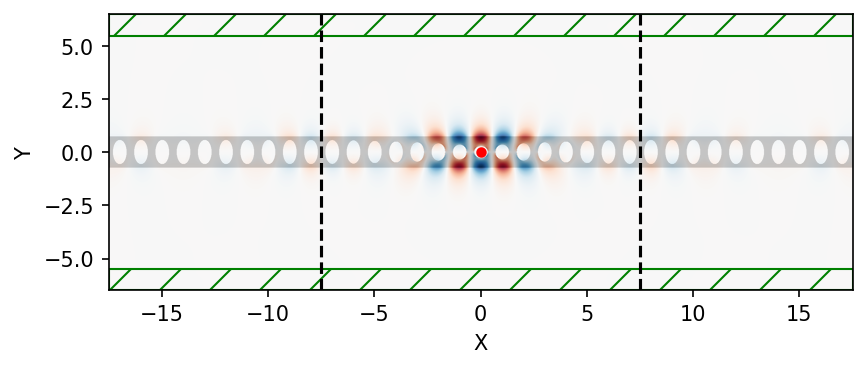

     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

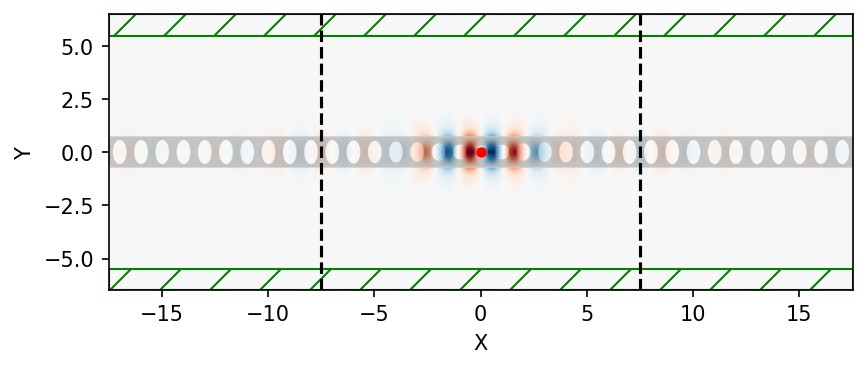

     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

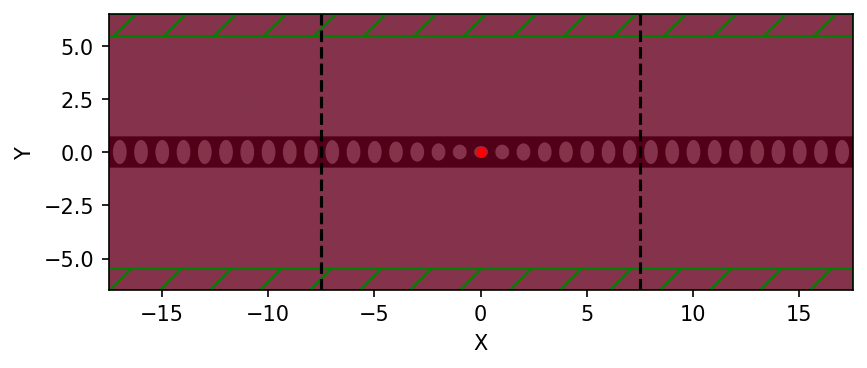

     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

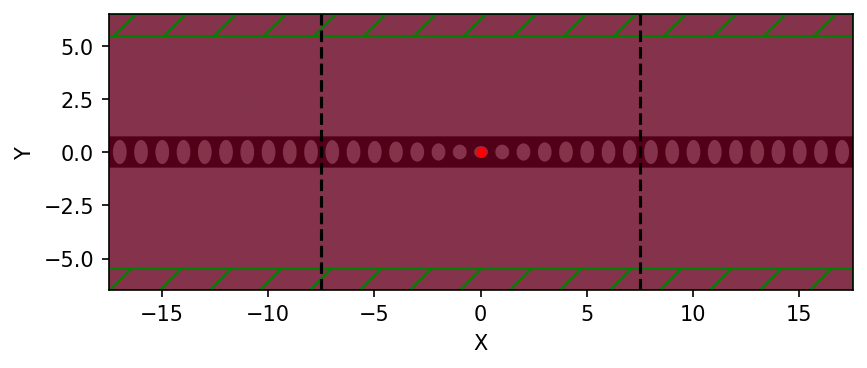

     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

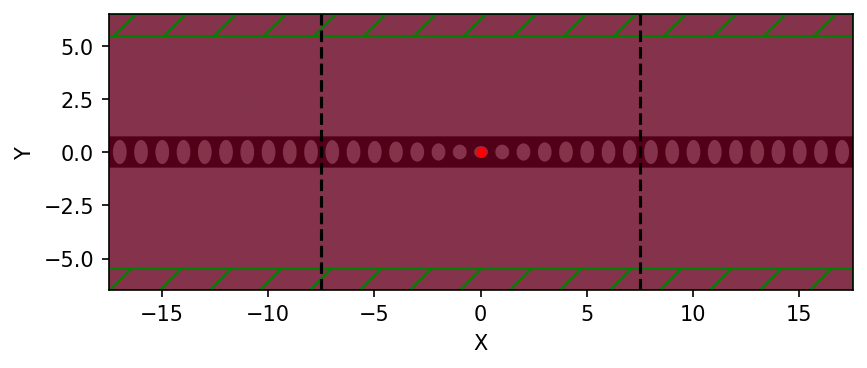

     block, center = (0,0,0)
          size (35,1.48368,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (12,12,12)
     ellipsoid, center = (-7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (7,0,0)
          size (0.646884,1.11869,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (6,0,0)
          size (0.646884,1.09199,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
     ellipsoid, center = (-5,0,0)
          size (0.646884,1.04748,0.652819)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielect

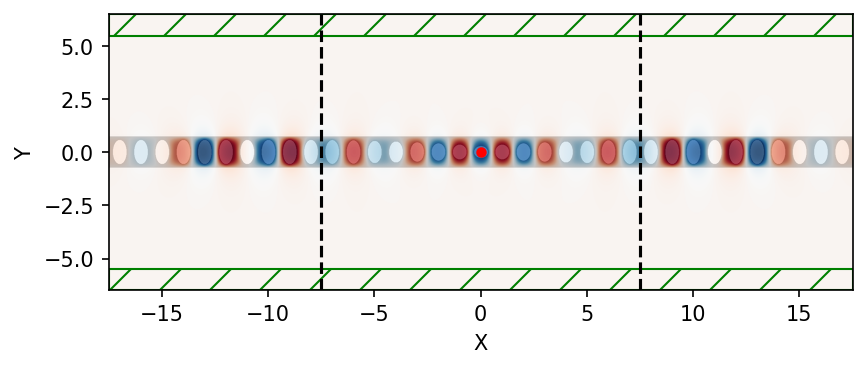

The max Q factor is 27027018.814846586, which came from 2 mirrors with a corresponding frequency of 162.57150638064817


In [25]:
mirror_array = range(1,11)
max_q = []
freq_of_q = []
for i in mirror_array: 
    print(f'Running for {i} mirrors')
    maxq_i, freq_i = tapered(500, length = 337, xlength= 218, ylengths= taperr, mirrorlength= 382, nummirrors= i)
    max_q.append(maxq_i)
    freq_of_q.append(freq_i)
print(f'The max Q factor is {max(max_q)}, which came from {mirror_array[max_q.index(max(max_q))]} mirrors with a corresponding frequency of {freq_of_q[max_q.index(max(max_q))]}')

mirror_array = range(1,5)
max_q = []
freq_of_q = []
for i in mirror_array: 
    print(f'Running for {i} mirrors')
    maxq_i, freq_i = tapered(500, length = 337, xlength= 218, ylengths= taperr, mirrorlength= 382, nummirrors= i)
    max_q.append(maxq_i)
    freq_of_q.append(freq_i)
print(f'The max Q factor is {max(max_q)}, which came from {mirror_array[max_q.index(max(max_q))]} mirrors with a corresponding frequency of {freq_of_q[max_q.index(max(max_q))]}')

maxqq = [18459, 25556, 16187, 26956, 14477, 24068, 14119, 21684, 16375, 26671]
num_mirros = range(1,11)
plt.plot(num_mirros, maxqq)


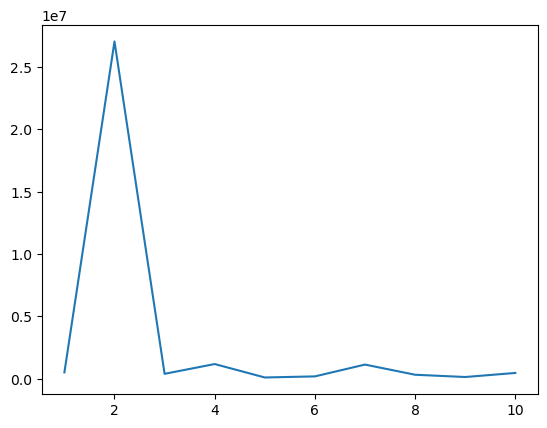

In [26]:
num_mirros = range(1,11)
plt.plot(num_mirros,max_q)

In [27]:
print(max_q)

[512657.9388346899, 27027018.814846586, 396920.7690331404, 1181804.8154693572, 104900.02578133043, 191500.69021707884, 1138328.8641593803, 323940.9075152374, 142152.72864378965, 467109.5879149279]
